# SHAP analysis — XGBoost and Random Forest

## Setup — data and models

The two tuned models are **loaded from the `.rds` files saved at the end of
`classification_tree.ipynb`** (`boost_cl_svi.rds`, `rforest_cl_svi.rds`) — they are not
retrained here.

The train/test split itself was not saved, so the cells below rebuild it from the data
using the same preprocessing and seeds as `classification_tree.ipynb`
(`set.seed(100)` for the split, `set.seed(42)` for SMOTE). Because both are
deterministic, the reconstructed `test` / `train_balanced` match exactly what the saved
models were trained and evaluated on.

In [21]:
# install once if needed:
# install.packages(c("shapviz", "kernelshap", "treeshap",
#                    "tidyverse", "janitor", "caret", "smotefamily",
#                    "xgboost", "randomForest"))
library(tidyverse)     # dplyr / readr / ggplot2 / purrr
library(janitor)       # clean_names
library(caret)         # createDataPartition
library(smotefamily)   # SMOTE
library(xgboost)
library(randomForest)
library(shapviz)
library(treeshap)

### Parameters

`def_outbreak` is the case count at which a county counts as an outbreak, and `perc_strata` the fraction of data used for training. `K_neighbors` and `Ratio_testtrain` are passed to SMOTE (0 lets SMOTE choose the duplication needed for a ~50/50 class balance).

In [22]:
# DATA RELATED PARAMS
def_outbreak = 4   # number of cases to be considered as outbreak
perc_strata = 0.75 # proportion of data to be used for training

# SMOTE RELATED PARAMS
K_neighbors = 5     # number of nearest neighbors
Ratio_testtrain = 0 # for 50/50 outbreak/non-outbreak

### Helper — drop redundant yes/no columns

Many survey features arrive as paired `_yes` / `_no` columns encoding the same information. For each pair this keeps one column, dropping whichever has more NAs (ties drop `_no`, keeping `_yes`).

In [23]:
# Find Yes/No pairs by stripping the suffix
  yes_cols <- cols[grepl("_yes", cols)]
  no_cols  <- cols[grepl("_no",  cols)]
  
  # Get base names for each
  yes_bases <- sub("_diff$", "", sub("_yes", "", yes_cols))
  no_bases  <- sub("_diff$", "", sub("_no",  "", no_cols))

drop_redundant_yn_features <- function(df) {
  # Get all column names
  cols <- names(df)
  
  # Find Yes/No pairs by stripping the suffix
  yes_cols <- cols[grepl("_yes", cols)]
  no_cols  <- cols[grepl("_no",  cols)]
  
  # Get base names for each
  yes_bases <- sub("_diff$", "", sub("_yes", "", yes_cols))
  no_bases  <- sub("_diff$", "", sub("_no",  "", no_cols))
  
  # Find bases that have BOTH a Yes and No column
  paired_bases <- intersect(yes_bases, no_bases)
  
  cols_to_drop <- c()
  
  for (base in paired_bases) {
    yes_col <- yes_cols[yes_bases == base]
    no_col  <- no_cols[no_bases == base]
    
    # Count NAs in each
    yes_nas <- sum(is.na(df[[yes_col]]))
    no_nas  <- sum(is.na(df[[no_col]]))
    
    # Drop whichever has more NAs 
    # If tied drop "No" (keep "Yes")
    if (no_nas >= yes_nas) {
      cols_to_drop <- c(cols_to_drop, no_col)
    } else {
      cols_to_drop <- c(cols_to_drop, yes_col)
    }
  }
  
  cat("Dropping", length(cols_to_drop), "redundant columns:\n")
  #cat(paste(" ", cols_to_drop), sep = "\n")
  
  df[, !names(df) %in% cols_to_drop]
}


### Load and preprocess the data

Reads the merged outbreak + SVI dataset, drops counties without SVI coverage, adds population density, then removes identifiers, redundant SVI variants, any column containing NAs, and redundant yes/no pairs. Ends with the stratified 75/25 train/test split (seed 100 — the same split the saved models were built on).

In [24]:
set.seed(100)

df <- read_csv("data/merged_with_svi.csv", show_col_types = FALSE) |> clean_names()

# counties not covered by SVI
df <- df %>% filter(!county %in% c("Mcculloch", "Mclennan", "Mcmullen", "Dewitt", "Loving"))
df_raw <- df
df$density <- df$population * 1.0 / df$area_sqmi

# drop identifiers and redundant SVI columns
df <- df %>% select(-c("county", "phr", "area_sqmi"),
                    -starts_with("m_"), -starts_with("mp_"), -starts_with("e_"),
                    -starts_with("epl_"), -starts_with("spl_"), -starts_with("rpl_"),
                    -starts_with("f_"))
df <- df %>% select(-c("ep_minrty", "ep_hisp", "ep_afam", "ep_pov150", "ep_uninsur"))
df <- df[, colSums(is.na(df)) == 0]      # drop columns containing any NA
df <- drop_redundant_yn_features(df)

# stratified train/test split
index <- createDataPartition(df$outbreak, p = perc_strata, list = FALSE)
train <- df[index, ]
test  <- df[-index, ]

Dropping 55 redundant columns:


In [25]:
names(train)

[1] "cve"                                                           
  [2] "outbreak"                                                      
  [3] "enrollment"                                                    
  [4] "population"                                                    
  [5] "pct_hispanic"                                                  
  [6] "pct_black"                                                     
  [7] "pct_white"                                                     
  [8] "pct_poverty"                                                   
  [9] "pct_uninsured"                                                 
 [10] "pct_college"                                                   
 [11] "pct_foreign_born"                                              
 [12] "advised_to_change_eating_hab_yes"                              
 [13] "advised_to_cut_down_salt_yes"                                  
 [14] "advised_to_exercise_yes"                                       
 [15] "advised_to_take_med_yes"                                       
 [16] "all_teeth_removed_65_no"                                       
 [17] "any_cancer_yes"                                                
 [18] "any_drinking_past_month_yes"                                   
 [19] "arthritis_yes"                                                 
 [20] "asthma_status_never"                                           
 [21] "bmi_3_categories_obese"                                        
 [22] "bmi_3_categories_overweight"                                   
 [23] "bmi_3_categories_recommended_range"                            
 [24] "bmi_4_categories_obese"                                        
 [25] "bmi_4_categories_overweight"                                   
 [26] "bmi_4_categories_recommended_range"                            
 [27] "bmi_5_categories_obese"                                        
 [28] "bmi_5_categories_overweight"                                   
 [29] "bmi_5_categories_recommended_range"                            
 [30] "bp_location_at_home"                                           
 [31] "bp_sharing_in_person"                                          
 [32] "binge_drinking_yes"                                            
 [33] "blind_no"                                                      
 [34] "copd_no"                                                       
 [35] "cvd_no"                                                        
 [36] "cervical_cancer_screening_yes"                                 
 [37] "cervical_cancer_screening_hp_yes"                              
 [38] "cervical_cancer_screening_pa_yes"                              
 [39] "chest_ct_or_cat_scan_yes"                                      
 [40] "clnscpy_sgmscpy_colonoscopy"                                   
 [41] "col_past_10_yrs_50_75_yes"                                     
 [42] "col_past_10_yrs_50_75_ia_yes"                                  
 [43] "coronary_heart_disease_no"                                     
 [44] "current_asthma_2_no"                                           
 [45] "current_e_cig_user_yes"                                        
 [46] "current_smoker_yes"                                            
 [47] "deaf_no"                                                       
 [48] "dentist_visit_past_year_yes"                                   
 [49] "depressive_disorder_yes"                                       
 [50] "diabetes_yes"                                                  
 [51] "diabetes_status_yes"                                           
 [52] "difficulty_concentrating_yes"                                  
 [53] "difficulty_doing_errands_alo_no"                               
 [54] "difficulty_dressing_no"                                        
 [55] "difficulty_walking_yes"                                        
 [56] "disability_status_yes"                                         
 [57] "dr_rx_pain_talk_yes

### Binarize the target and balance the training set

`outbreak` becomes 0/1 at the `def_outbreak` threshold, then SMOTE (seed 42) oversamples the minority class to roughly 50/50. The test set keeps its natural class balance — only the column set and outbreak coding are mirrored onto it.

In [5]:
train$outbreak <- as.integer(train$outbreak >= def_outbreak)

set.seed(42)
smote_output <- SMOTE(
  X        = train[, names(train) != "outbreak"],
  target   = train$outbreak,
  K        = K_neighbors,
  dup_size = Ratio_testtrain
)

train_balanced <- smote_output$data
names(train_balanced)[names(train_balanced) == "class"] <- "outbreak"
train_balanced$outbreak <- as.factor(train_balanced$outbreak)
cat("\nClass balance after SMOTE:\n")
print(table(train_balanced$outbreak))

# mirror the same columns / outbreak coding onto the test set
test <- test[, names(train)]
test <- test[, !names(test) %in% c("county")]
test$outbreak <- as.integer(test$outbreak >= def_outbreak)


Class balance after SMOTE:

  0   1 
177 170 


### Tuned random forest (loaded)

Loads the tuned model saved by `classification_tree.ipynb` (not retrained), then predicts outbreak/no-outbreak on the held-out test set and compares to the true labels. The cutoff `c` sets how large a share of trees must agree to call an outbreak.

In [6]:
rforest_model <- readRDS("data/results/models/rforest_cl_svi.rds")

c = 0.4 # how many trees need to agree
pred_rf <- predict(rforest_model, newdata = test, type = "class", cutoff = c(c, 1 - c))
rforest_table <- table(Actual = test$outbreak, Predicted = pred_rf)
rforest_table

      Predicted
Actual  0  1
     0 56  1
     1  3  2

### Tuned XGBoost (loaded)

Loads the tuned model saved by `classification_tree.ipynb` (not retrained). A predicted probability ≥ the cutoff counts as a predicted outbreak; the confusion matrix compares against the true labels.

In [7]:
boost_model <- readRDS("data/results/models/boost_cl_svi.rds")

cutoff = 0.4
X_test <- as.matrix(test[, names(test) != "outbreak"])
y_test <- as.numeric(as.character(test$outbreak))

pred_xgb <- as.integer(predict(boost_model, X_test) >= cutoff)
boost_table <- table(Actual = y_test, Predicted = pred_xgb)
boost_table

      Predicted
Actual  0  1
     0 55  2
     1  2  3

## XGBoost — SHAP

Computes SHAP values for the whole test set from the tuned model. `interactions = TRUE` means SHAP also calculates each variable's impact on other variables (the pairwise interaction values used further down).

In [8]:
shp_xgb <- shapviz(boost_model, X_pred = X_test, X = as.data.frame(X_test), interactions = TRUE)

### Investigating false negatives

Locates the false negatives (true outbreak, predicted no-outbreak at the cutoff) and draws a SHAP waterfall for one of them — change `id` in the cell to inspect a different one.

Reading the waterfall: the baseline plus the sum of that row's SHAP values (the bars) equals the raw log-odds prediction `f(x)`, and the probability is `p = 1 / (1 + exp(-f(x)))`.

[1] 12 40

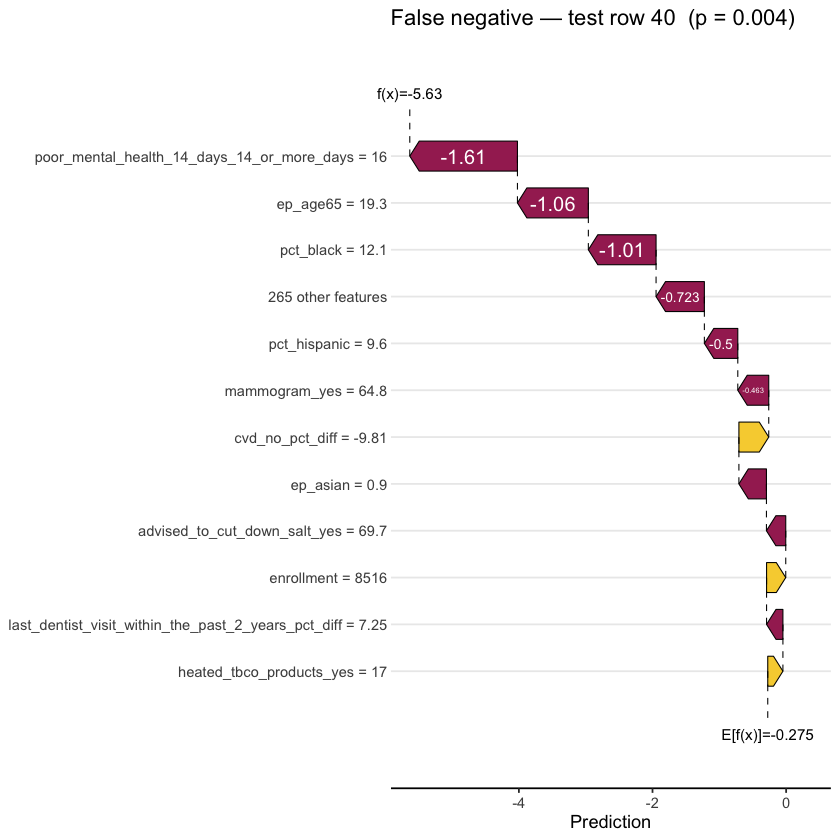

In [9]:
pred   <- predict(boost_model, X_test)
fn_ids <- which(y_test == 1 & pred < cutoff)
fn_ids                                   # test-row indices of the FNs

id = 2  # which false negative to inspect
sv_waterfall(shp_xgb, row_id = fn_ids[id], max_display = 12) +
  ggtitle(sprintf("False negative — test row %d  (p = %.3f)", fn_ids[id], pred[fn_ids[id]]))

# p = 1 / (1 + exp(-log_odds))
# baseline + sum(that row's SHAP values) = f(x)      # the raw log-odds prediction
# -3.17    + (all the bars)              = f(x)

### Global feature importance (beeswarm)

Top 15 features by mean |SHAP|. Each point is one county: yellow = high feature value, purple = low; the x-position is that feature's contribution to the log-odds of an outbreak.

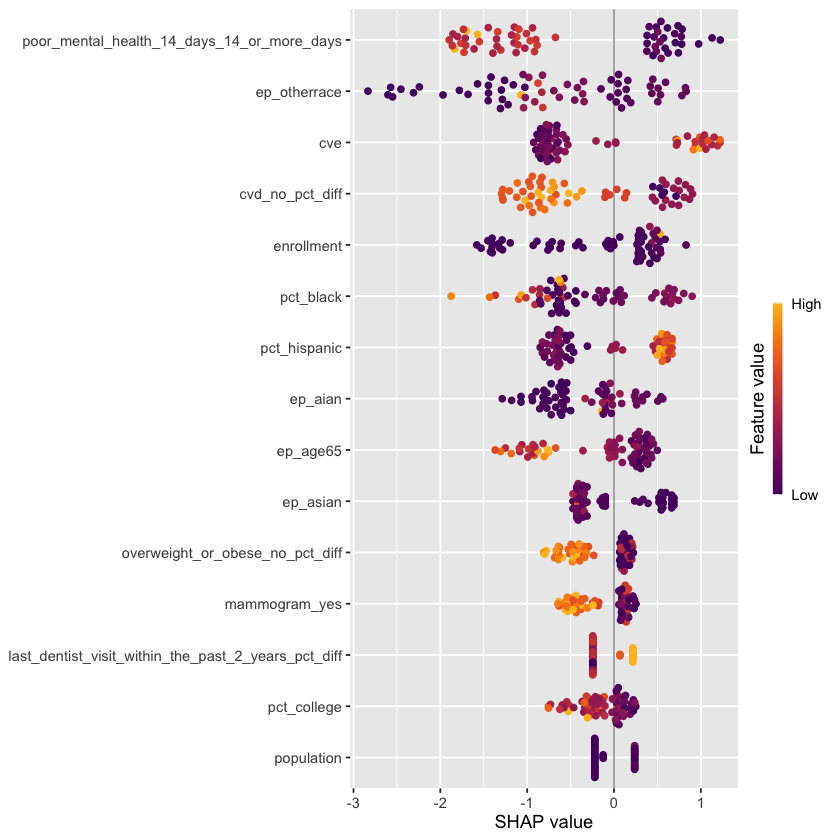

In [10]:
sv_importance(shp_xgb, kind = "beeswarm", max_display = 15)

### Review notes

No output — comments recording observations from an earlier `sv_dependence` review of `enrollment` (that plot has since been removed).

In [11]:
# No plotting code here — these are observations recorded while reviewing the
# (since-removed) sv_dependence(shp_xgb, v = "enrollment", color_var = "auto") plot:
# 1. fix the axis so you can see the bulk instead of the one outlier
# lots of high enrollment statistics are in the lower part
# potential significant weight on population
# All the false negatives are smaller counties, suggesting model is not great
# at predicting outbreak counties with small datasets

### Feature interaction ranking

Computes the mean absolute SHAP interaction matrix (features × features): the diagonal is each feature's main effect, the off-diagonal entries are pairwise interaction strengths. Since the matrix is symmetric, only one copy of each pair is kept.

Each pair's interaction is then judged against the larger of its two **own** main effects (`vs_own = interaction / own_main`) — benchmarking against the pair's own features rather than a global average avoids being skewed by the many weak features in the model. Pairs whose interaction is at least 10% of the bigger main effect are flagged as worth a closer look (threshold lowered from 0.25 to 0.1).

In [12]:
# Full interaction matrix + named main effects
# Compute the mean absolute SHAP interaction matrix (features x features).
# kind = "no" returns the raw numbers instead of a plot.
# Diagonal = each feature's main effect; off-diagonal = pairwise interaction strength.
m  <- sv_interaction(shp_xgb, kind = "no")

# Pull out the diagonal (each feature's own main effect) as a vector, and
# re-attach the feature names — diag() strips names, which would break the
# lookups in step 4 (this was the bug that produced all-NA output).
md <- setNames(diag(m), rownames(m))


# Rank EVERY pair
# Copy the matrix so we can blank out the half we don't need without touching m.
m2 <- m

# The matrix is symmetric, so each pair appears twice. Set the lower triangle
# AND the diagonal to NA, leaving only one copy of each unique off-diagonal pair.
m2[lower.tri(m2, diag = TRUE)] <- NA

# Flatten the matrix into a long data frame: one row per cell, with the two
# feature names and the interaction value.
pairs <- as.data.frame(as.table(m2))

# Drop the cells we blanked out (the NA lower triangle + diagonal), leaving
# only the unique feature pairs.
pairs <- pairs[!is.na(pairs$Freq), ]

# Give the columns readable names (as.table defaults to Var1/Var2/Freq).
names(pairs) <- c("feature_a", "feature_b", "interaction")


# Judge against each pair's OWN main effects
# For each pair, look up both features' main effects and keep the larger one.
# Benchmarking against the pair's own features (not a global average) avoids
# being skewed by the many weak features in the model.
pairs$own_main <- pmax(md[as.character(pairs$feature_a)],
                       md[as.character(pairs$feature_b)])

# Express the interaction as a fraction of that main effect: "how big is this
# interaction relative to what these features do on their own?"
pairs$vs_own   <- round(pairs$interaction / pairs$own_main, 3)

# Flag pairs whose interaction is at least 10% of the bigger main effect as
# potentially worth a closer look (threshold lowered from 0.25 to 0.1).
pairs$worth    <- ifelse(pairs$vs_own >= 0.1, "yes", "no")

# Sort strongest-to-weakest by absolute interaction magnitude.
pairs <- pairs[order(-pairs$interaction), ]


# Print only the worth-keeping pairs (which() ignores any NA)
worth_pairs <- pairs[which(pairs$worth == "yes"), ]
#worth_pairs

### Confirming candidate interactions (XGBoost)

Builds a de-duplicated shortlist of the flagged pairs, then runs two checks on each:

1. **Dependence plot** — SHAP of feature A vs A, colored by feature B. A real interaction shows as a color gradient or slope change, not a random color mix.
2. **Correlation check** — highly correlated features can produce apparent "interactions" that are really redundancy; high `abs_corr` rows are the suspects.

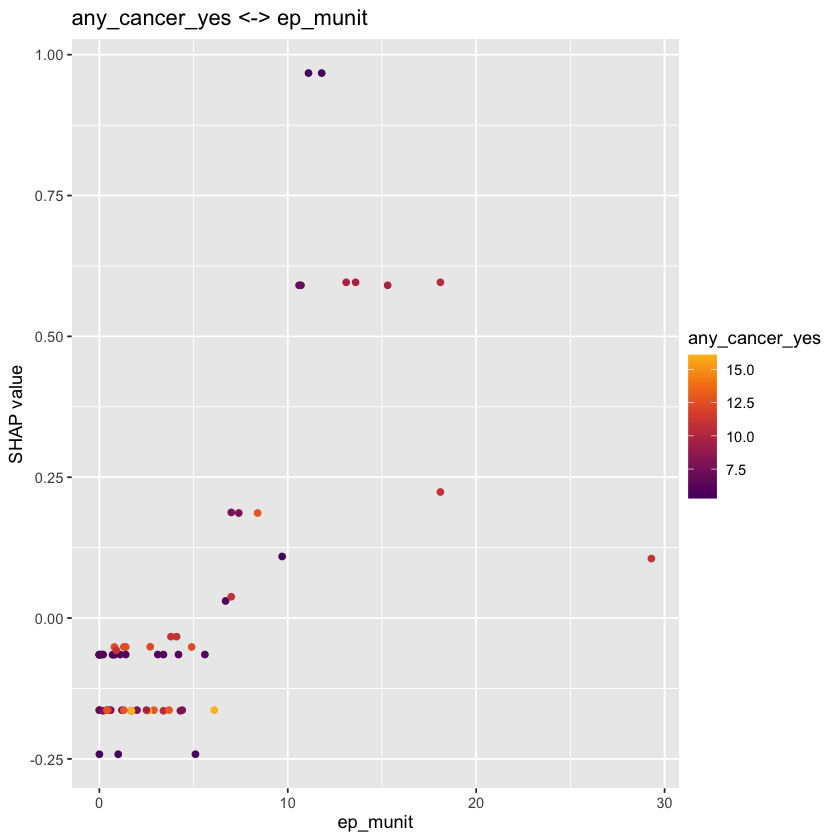

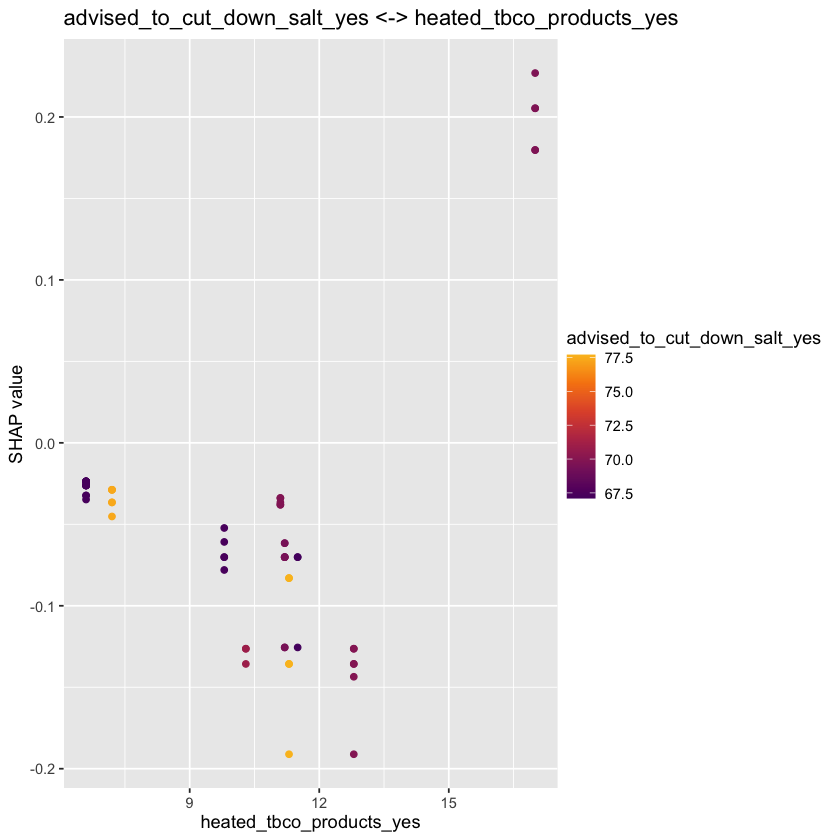

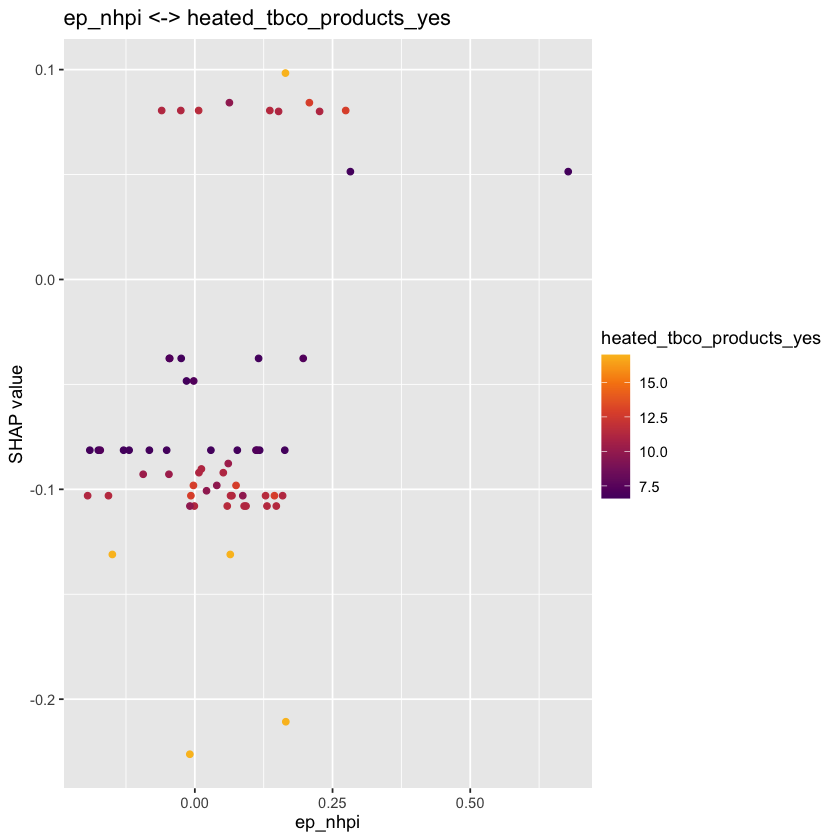

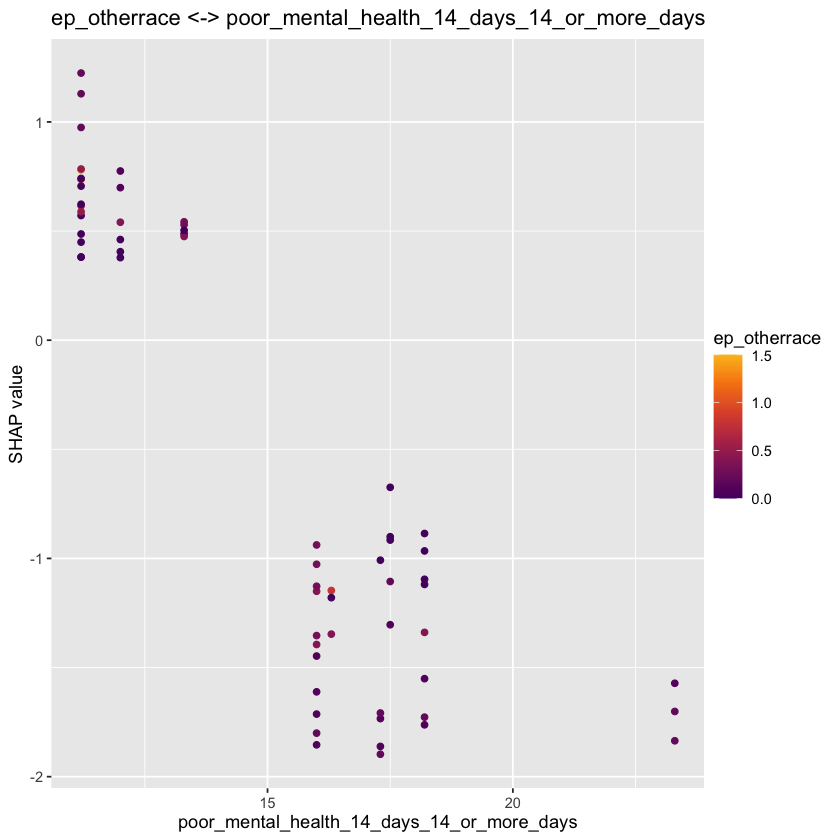

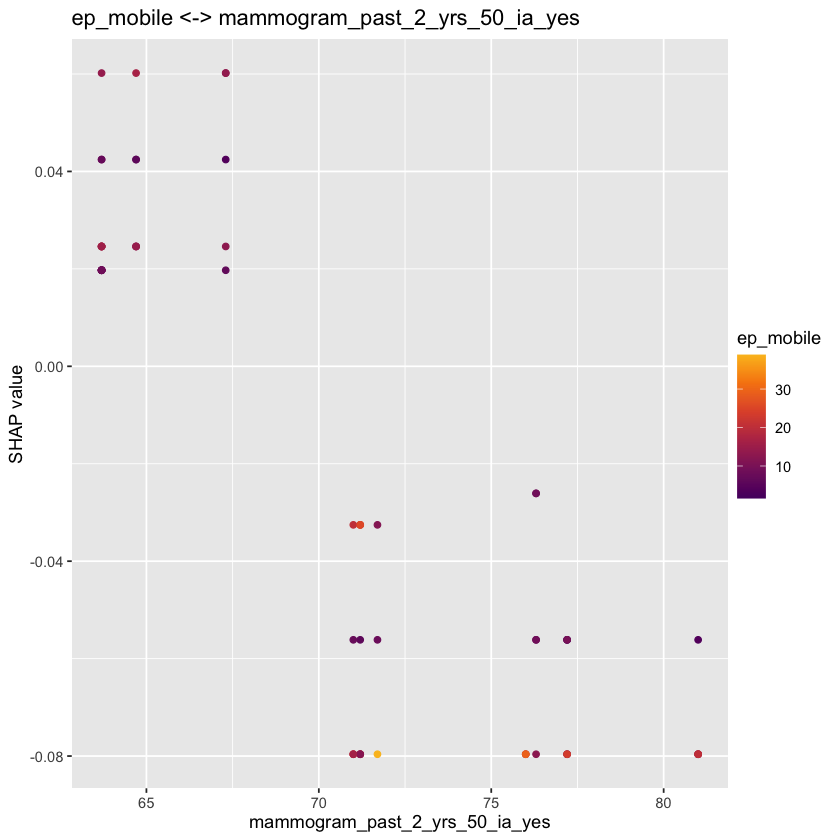

...

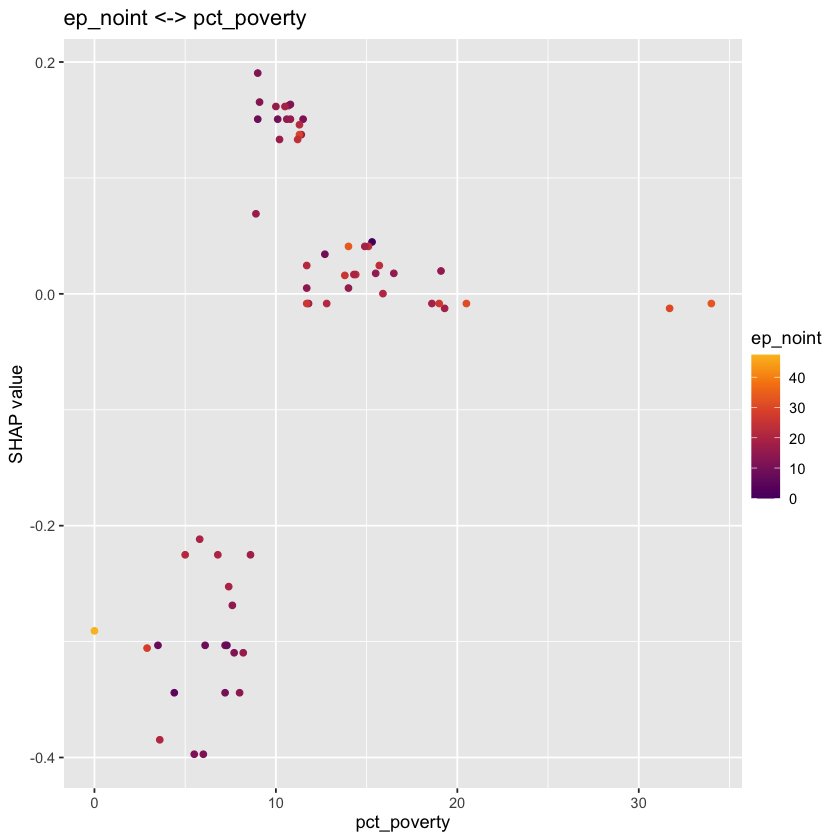

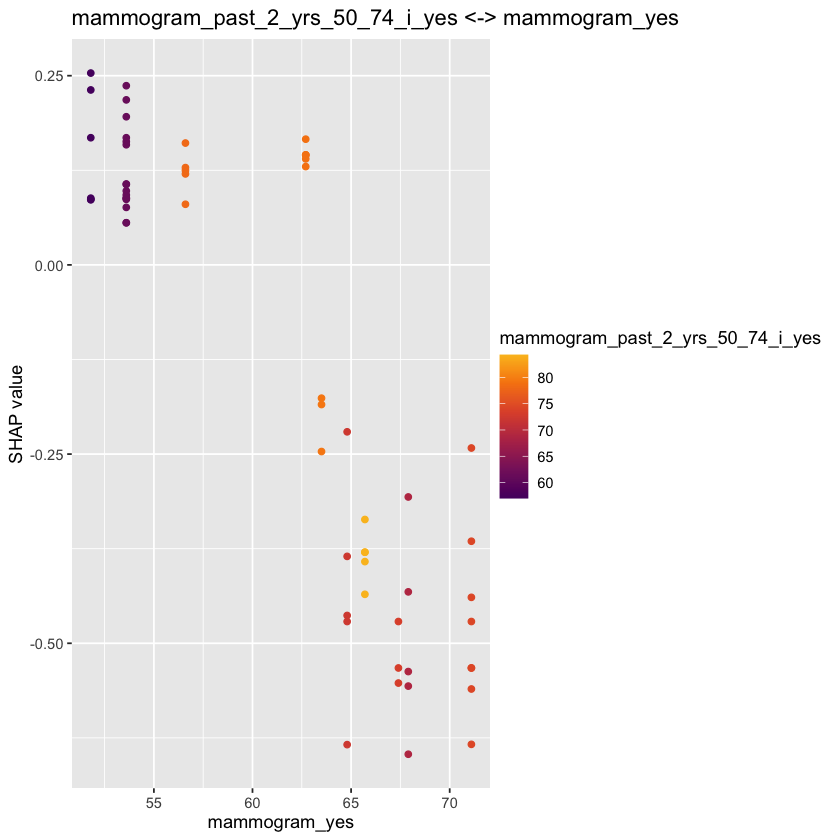

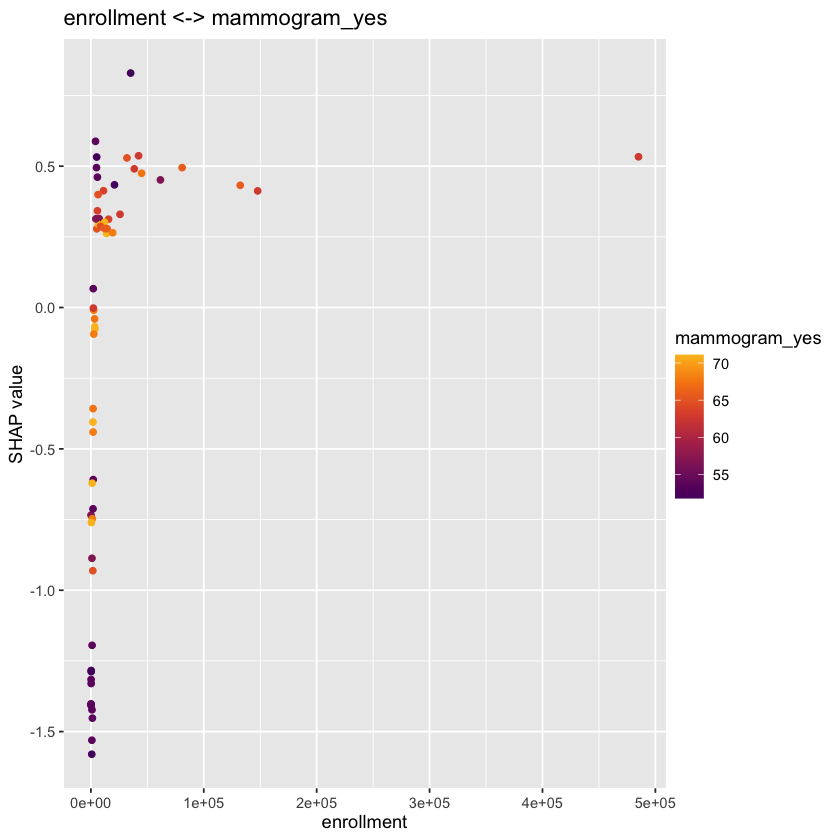

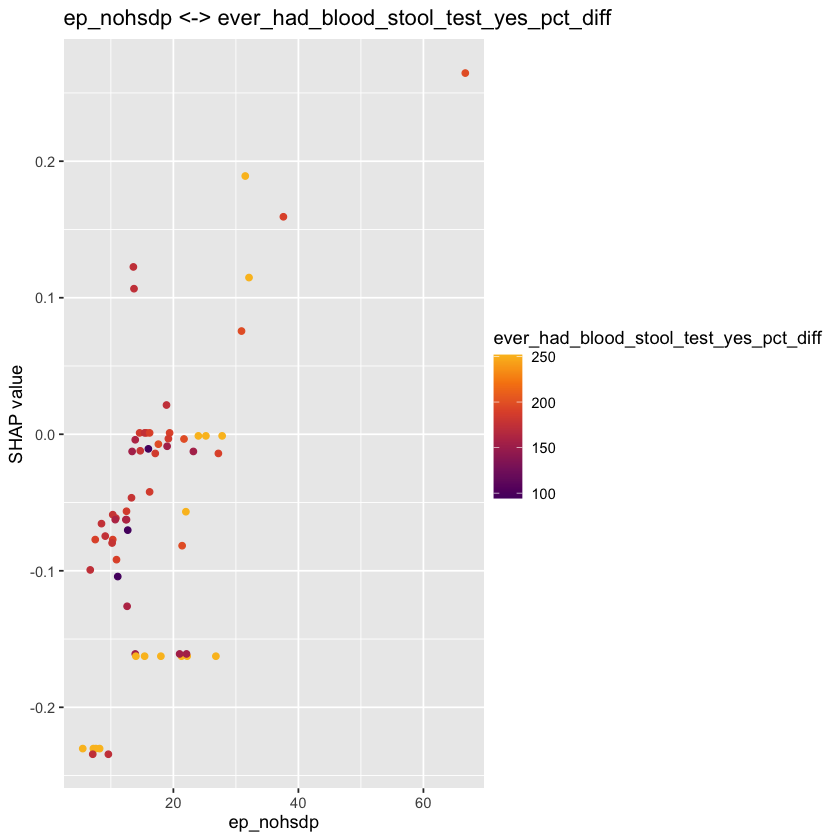

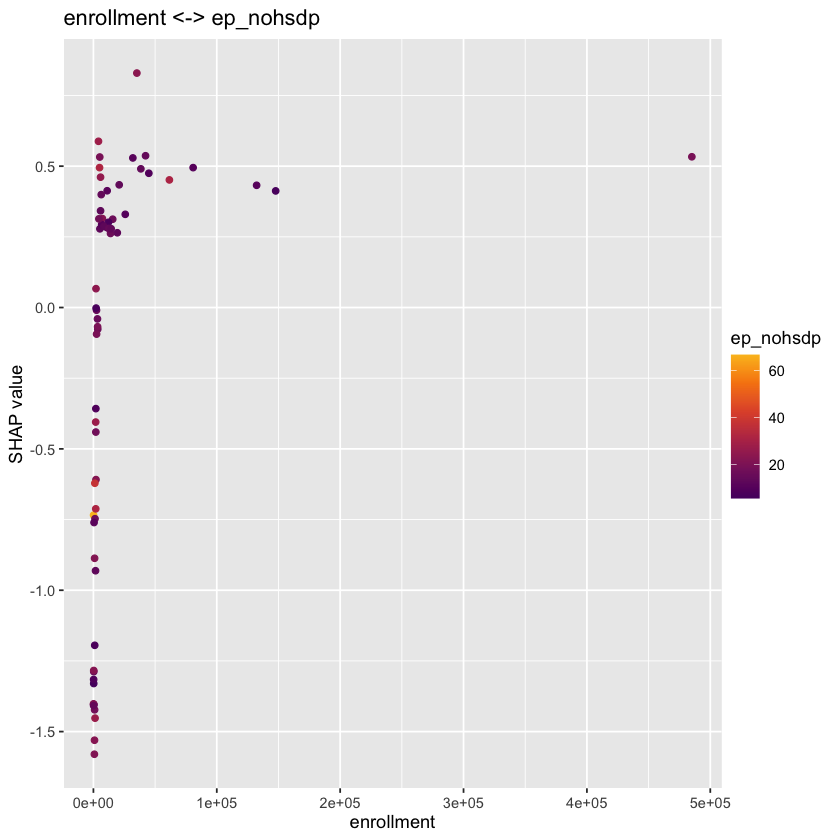

# A tibble: 31 × 3
   pair                                                          vs_own abs_corr
   <chr>                                                          <dbl>    <dbl>
 1 mammogram_past_2_yrs_50_74_i_yes <-> mammogram_yes             0.122    0.690
 2 cve <-> pct_college                                            0.186    0.527
 3 cve <-> ep_age65                                               0.111    0.440
 4 ep_hburd <-> mammogram_past_2_yrs_50_74_i_yes                  0.13     0.388
 5 current_asthma_2_no <-> poor_mental_health_14_days_14_or_mor…  0.128    0.352
 6 ep_asian <-> mammogram_past_2_yrs_40_yes_pct_diff              0.185    0.317
 7 ep_noint <-> pct_poverty                                       0.126    0.294
 8 ep_groupq <-> pct_college                                      0.144    0.291
 9 cvd_no_pct_diff <-> ep_munit                                   0.226    0.275
10 ep_age65 <-> pct_black                                         0.166    0.232
# ℹ 21 mo

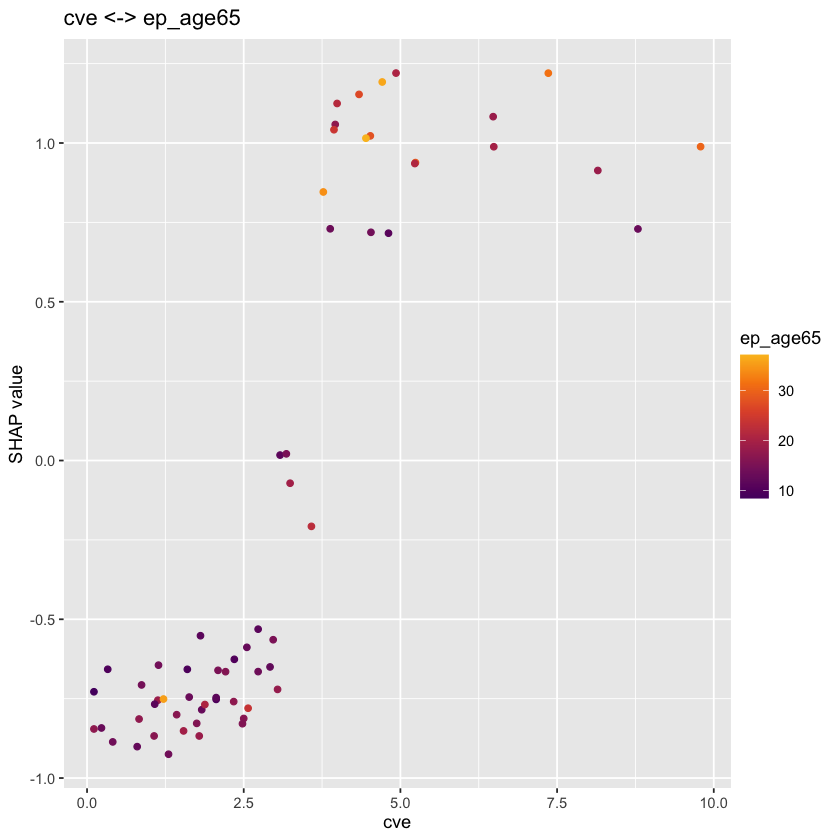

In [13]:
# Your feature data, as a data.frame (X_test is the matrix used to build shp)
Xdf <- as.data.frame(X_test)

# Shortlist = worth=="yes", de-duplicated, ranked by vs_own
candidates <- worth_pairs %>%
  filter(worth == "yes") %>%
  mutate(a = as.character(feature_a), b = as.character(feature_b),
         pair = paste(pmin(a, b), pmax(a, b), sep = " <-> ")) %>%
  distinct(pair, .keep_all = TRUE) %>%
  arrange(desc(vs_own))

## STEP 1 — dependence plot per candidate pair
for (i in seq_len(nrow(candidates))) {
  print(
    sv_dependence(shp_xgb, v = candidates$a[i], color_var = candidates$b[i]) +
      ggtitle(candidates$pair[i])
  )
}

## STEP 2 — flag correlation-induced "interactions"
feats <- unique(c(candidates$a, candidates$b))
corr  <- cor(Xdf[, feats], use = "pairwise.complete.obs")
candidates <- candidates %>%
  rowwise() %>% mutate(abs_corr = abs(corr[a, b])) %>% ungroup()

print(candidates %>%
        select(pair, vs_own, abs_corr) %>%
        arrange(desc(abs_corr)))   # high abs_corr rows are the suspects

### Manually reviewed pairs (XGBoost)

Dependence plots for a hand-picked list of pairs taken from the interaction table above — each plot shows SHAP(A) vs A, colored by B.

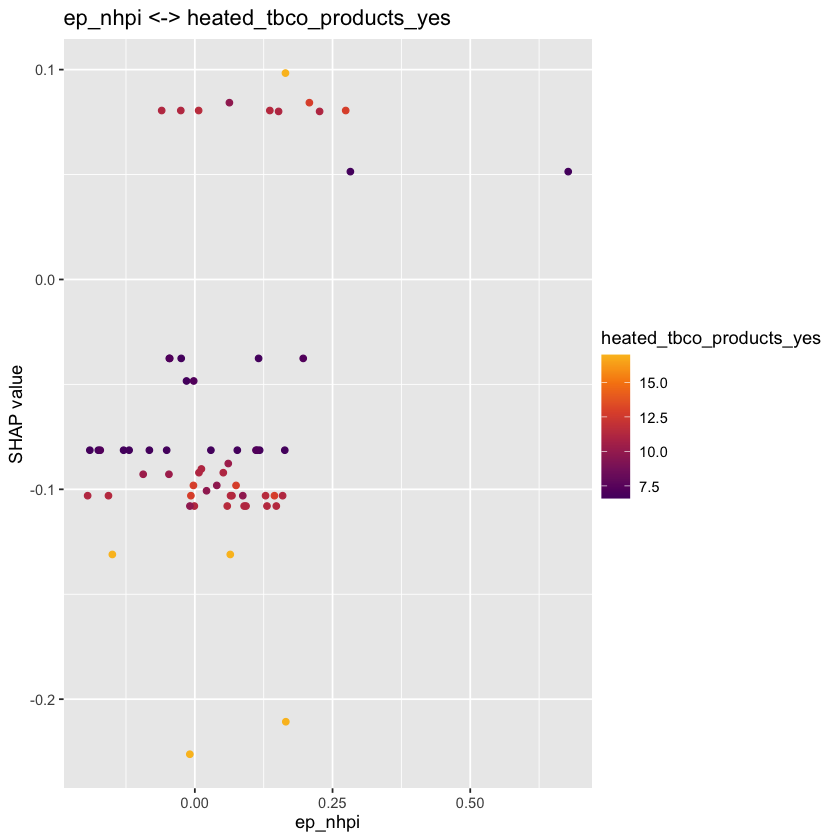

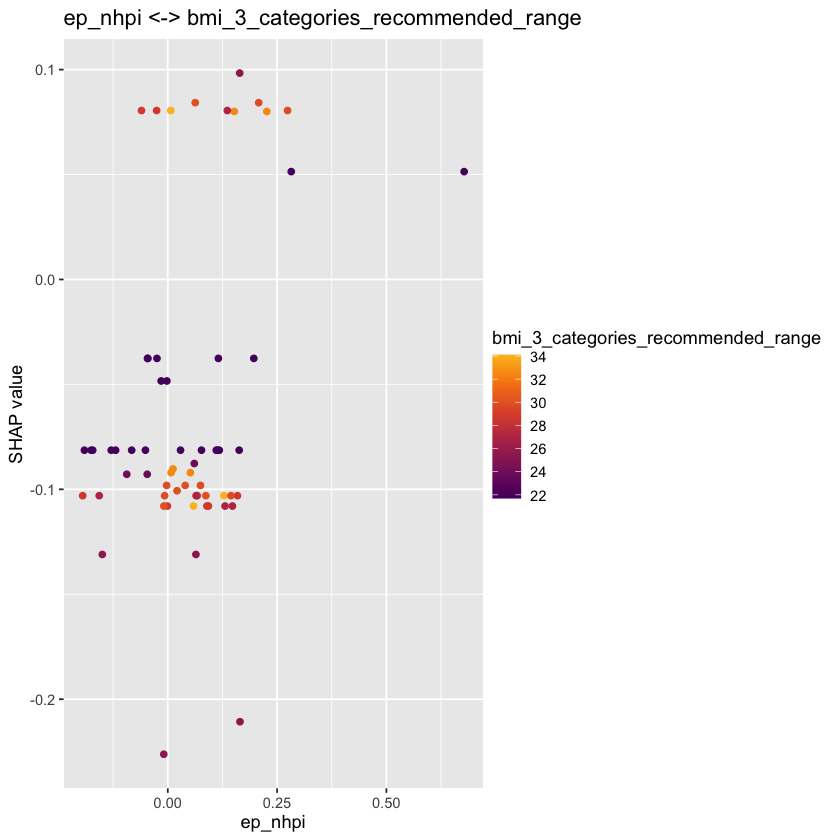

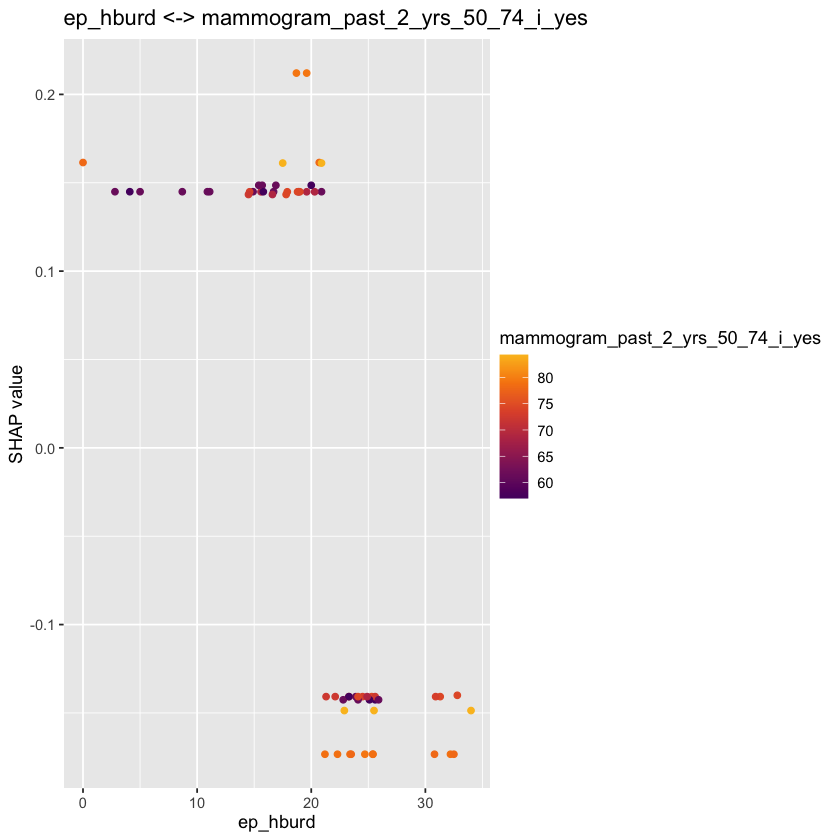

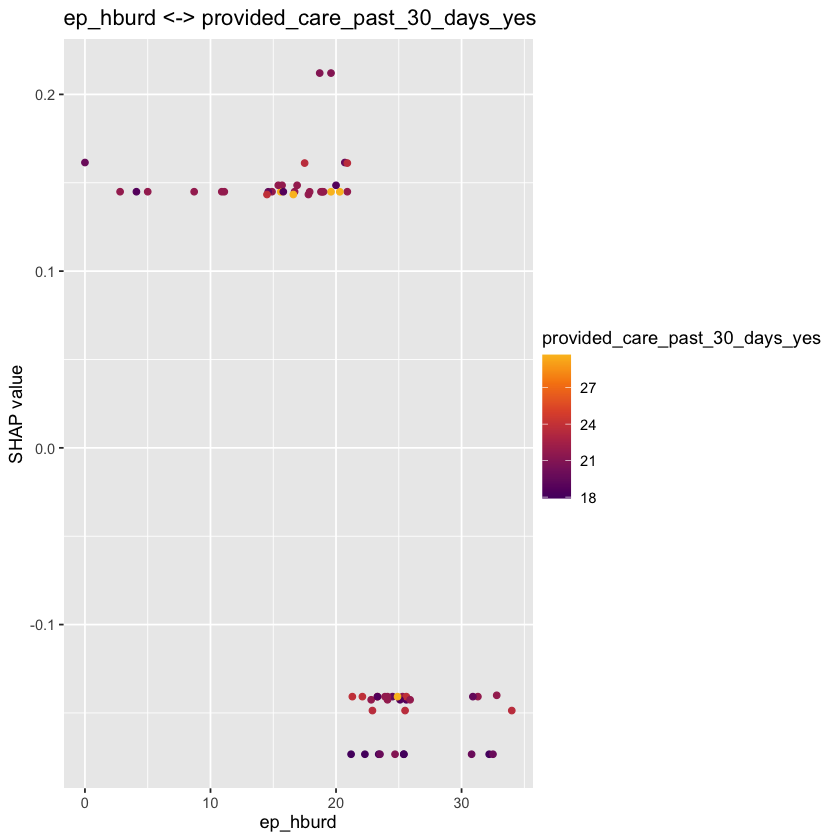

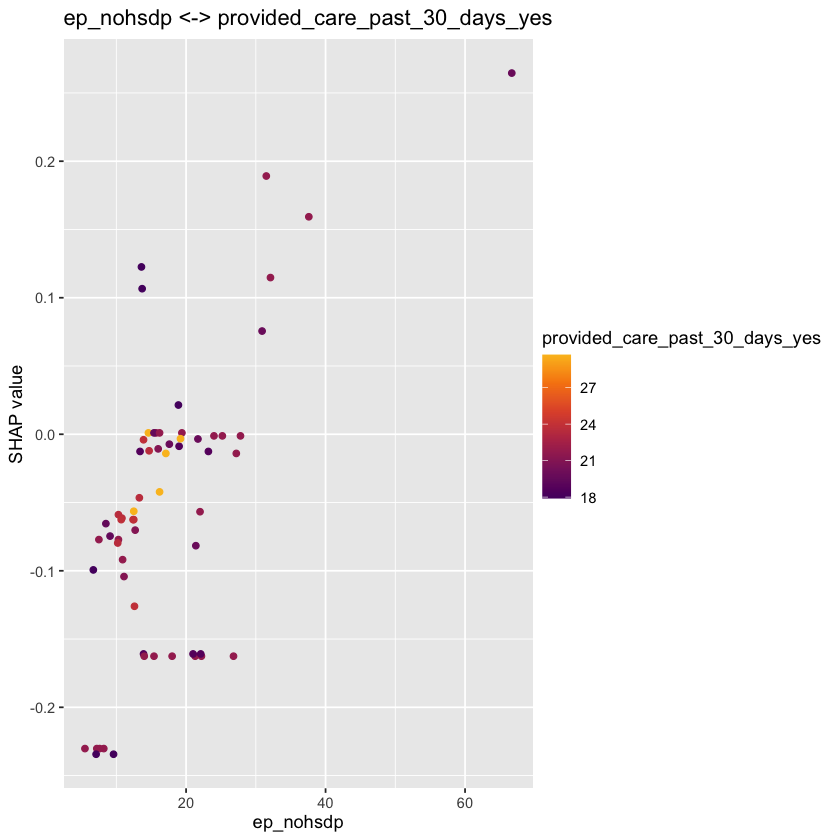

...

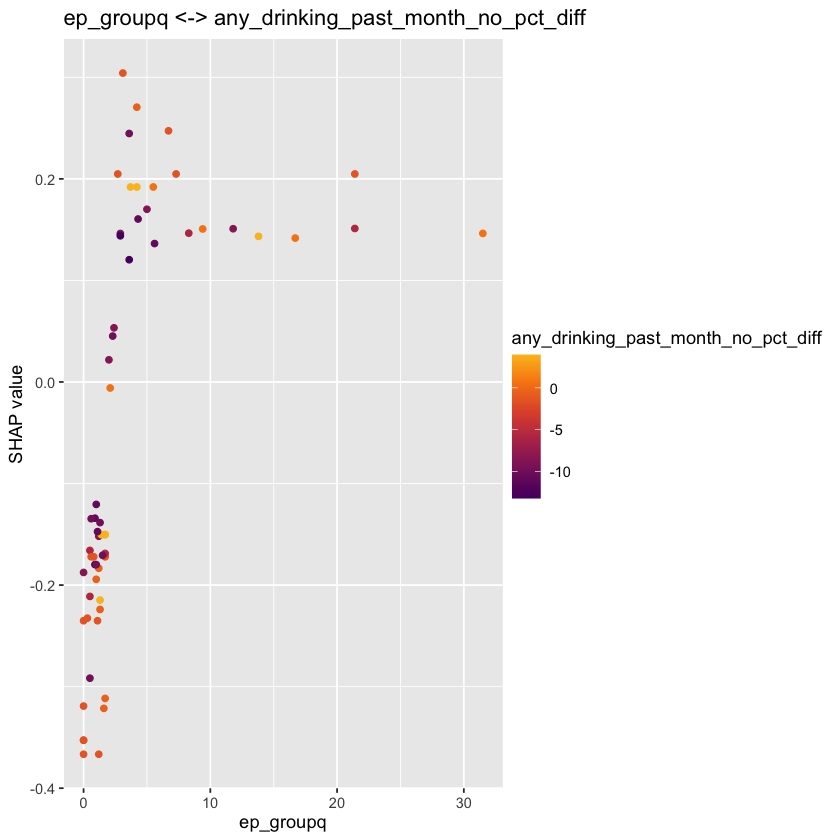

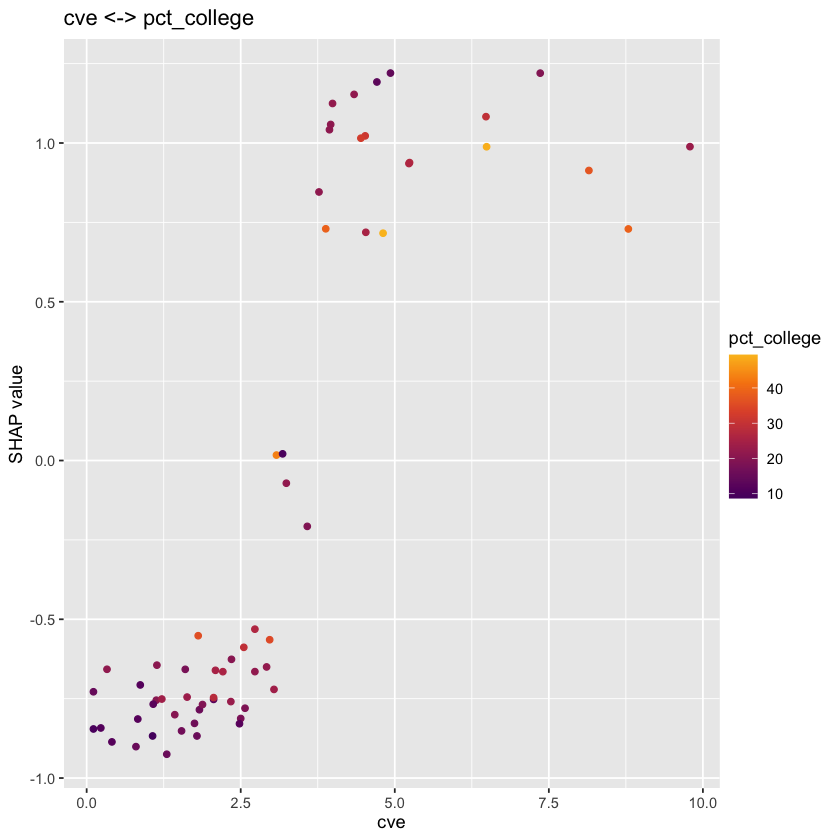

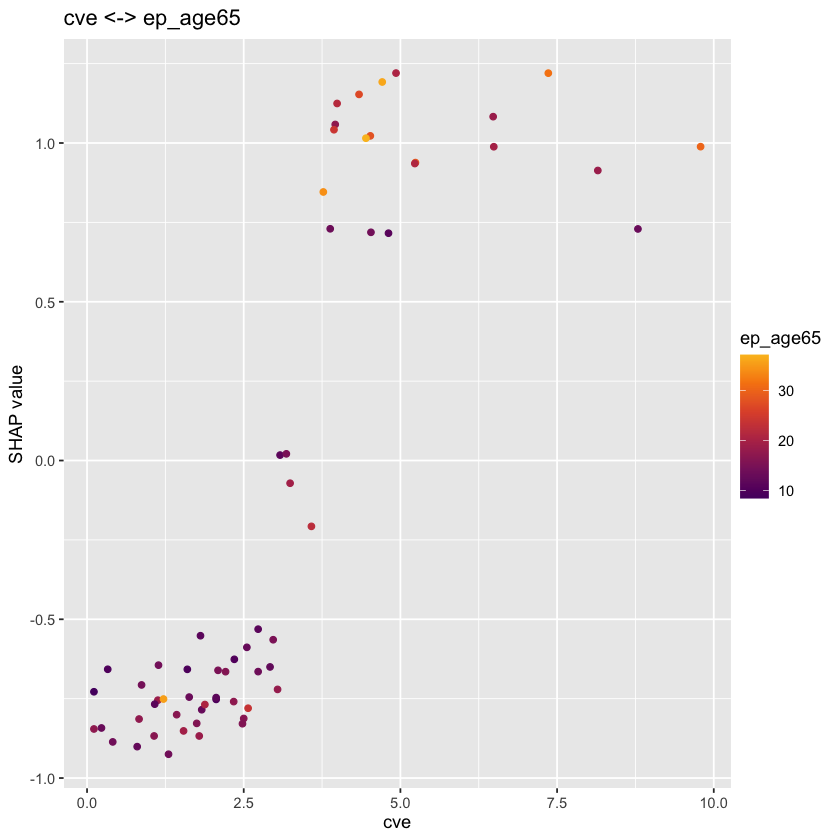

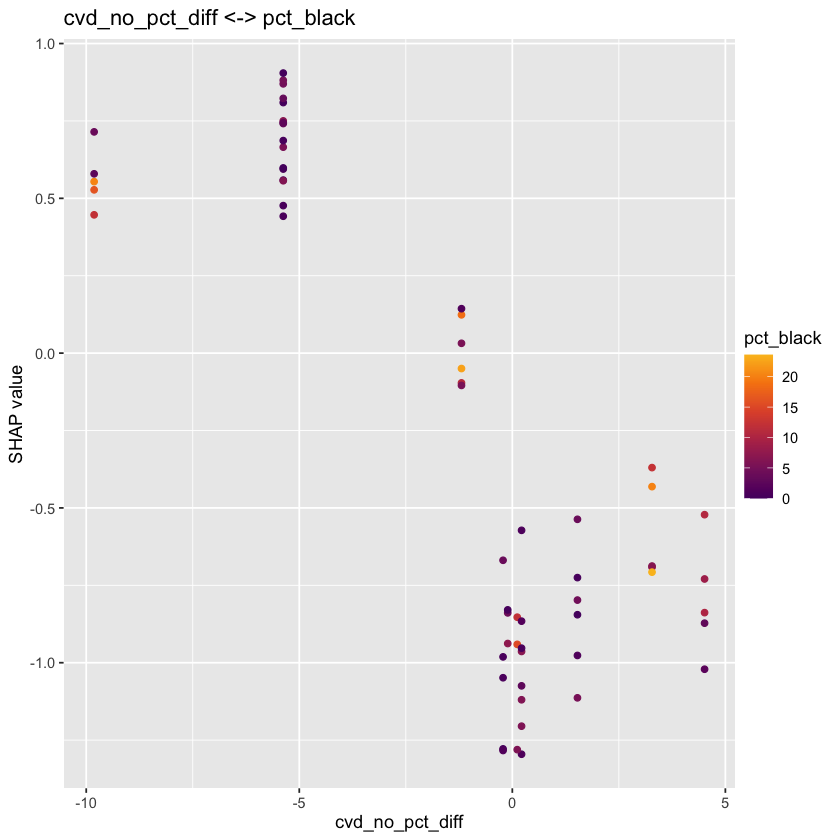

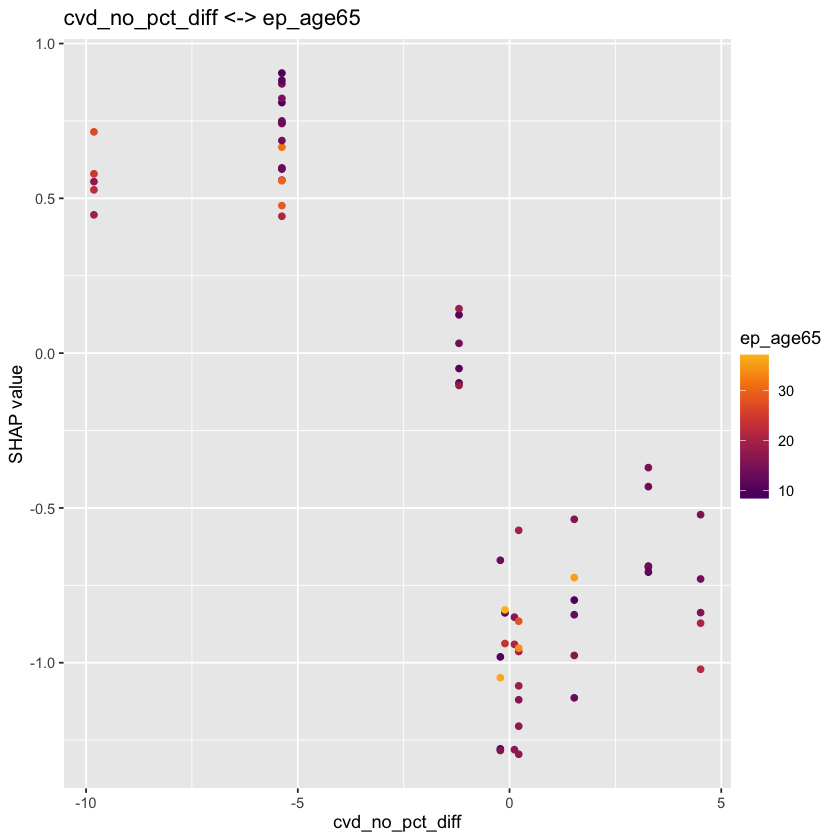

In [14]:
pairs_looked_at <- list(
  c("ep_nhpi",          "heated_tbco_products_yes"),
  c("ep_nhpi",          "bmi_3_categories_recommended_range"),
  c("ep_hburd",         "mammogram_past_2_yrs_50_74_i_yes"),
  c("ep_hburd",         "provided_care_past_30_days_yes"),     # table pair (you wrote ep_hburd)
  c("ep_nohsdp",        "provided_care_past_30_days_yes"),
  c("cvd_no_pct_diff",  "pct_college"),
  c("cvd_no_pct_diff",  "ep_munit"),
  c("ep_groupq",        "any_drinking_past_month_no_pct_diff"),
  c("cve",              "pct_college"),
  c("cve",              "ep_age65"),
  c("cvd_no_pct_diff",  "pct_black"),
  c("cvd_no_pct_diff",  "ep_age65")
)

for (p in pairs_looked_at) {
  print(
    sv_dependence(shp_xgb, v = p[1], color_var = p[2]) +
      ggtitle(paste(p[1], "<->", p[2])))
}

## Random forest — SHAP

`shapviz` cannot read a `randomForest` object directly, so SHAP values come from `treeshap` (exact tree SHAP). A single `treeshap(..., interactions = TRUE)` call yields both the per-row SHAP values and the exact pairwise interaction values. The cells from here to the cross-model check mirror the XGBoost analysis above.

Note: for this forest the SHAP values are in **probability** units, unlike XGBoost's log-odds.

In [15]:
feat       <- setdiff(names(test), "outbreak")
X_train_df <- as.data.frame(train_balanced[, feat])   # predictors the forest was trained on
X_expl     <- as.data.frame(test[, feat])             # rows to explain (test set)

# unify the randomForest into treeshap's model representation, then explain;
# interactions = TRUE also computes the exact SHAP interaction matrix
unified_rf <- randomForest.unify(rforest_model, X_train_df)
ts_rf      <- treeshap(unified_rf, X_expl, interactions = TRUE)

# one shapviz object drives everything downstream
shp_rf     <- shapviz(ts_rf, X = X_expl)
shp_rf_int <- shp_rf

|0%----|------|20%---|------|40%---|------|60%---|------|80%---|------|100%


### Investigating false negatives

Recomputes the class prediction at the same cutoff used in the confusion matrix above, plus the predicted outbreak probability for the plot title. False negatives are true outbreaks predicted as no-outbreak at that cutoff; change `id` in the cell to inspect a different one.

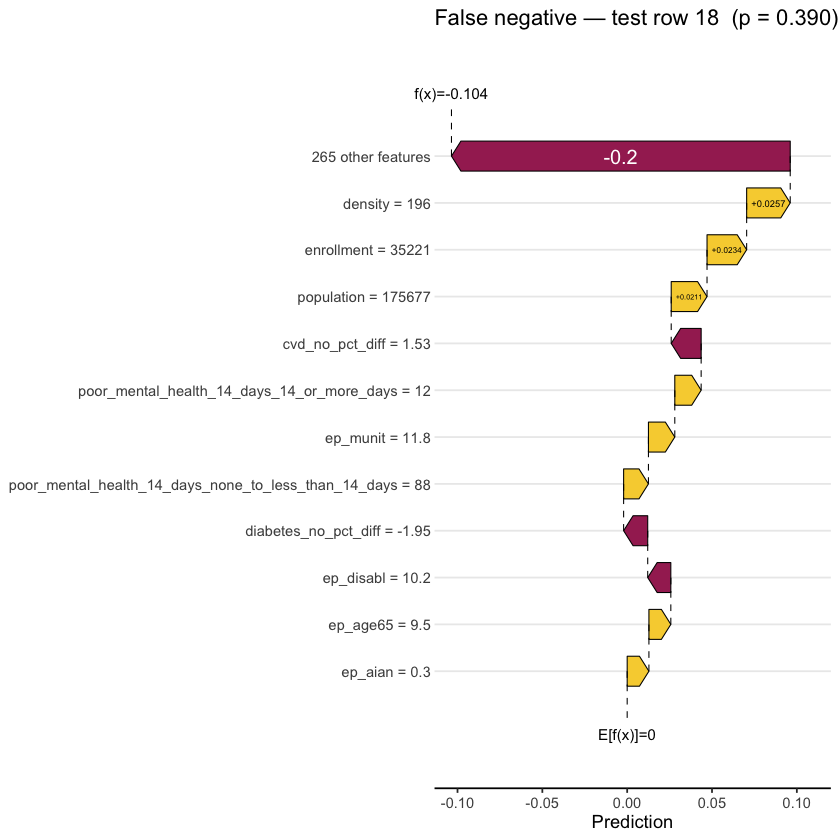

In [16]:
c <- 0.4
pred_rf <- predict(rforest_model, newdata = test, type = "class", cutoff = c(c, 1 - c))
prob_rf <- predict(rforest_model, newdata = test, type = "prob")[, "1"]

# false negatives: true outbreak, predicted no-outbreak at this cutoff
fn_rf <- which(test$outbreak == 1 & prob_rf < c)
#fn_rf

id = 1  # which false negative to inspect
if (length(fn_rf) >= id) {
  sv_waterfall(shp_rf, row_id = fn_rf[id], max_display = 12) +
    ggtitle(sprintf("False negative — test row %d  (p = %.3f)", fn_rf[id], prob_rf[fn_rf[id]]))
}

### SHAP beeswarms

Yellow = high feature value, purple = low; each SHAP value is one county's contribution to the predicted outbreak probability. First a beeswarm over a subset of variables with a consistent direction of effect (`enrollment`, `density`, and `population` are `log1p`-transformed for readability — the SHAP values themselves are unchanged), then single-feature beeswarms for `pct_hispanic` and `cve`, then the full beeswarm across every feature.

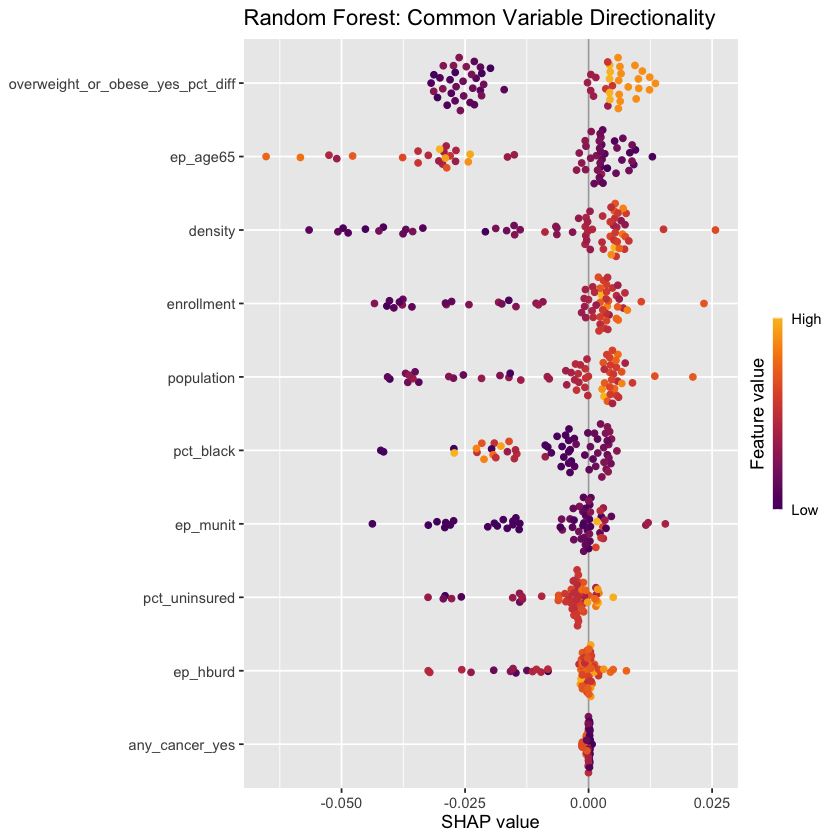

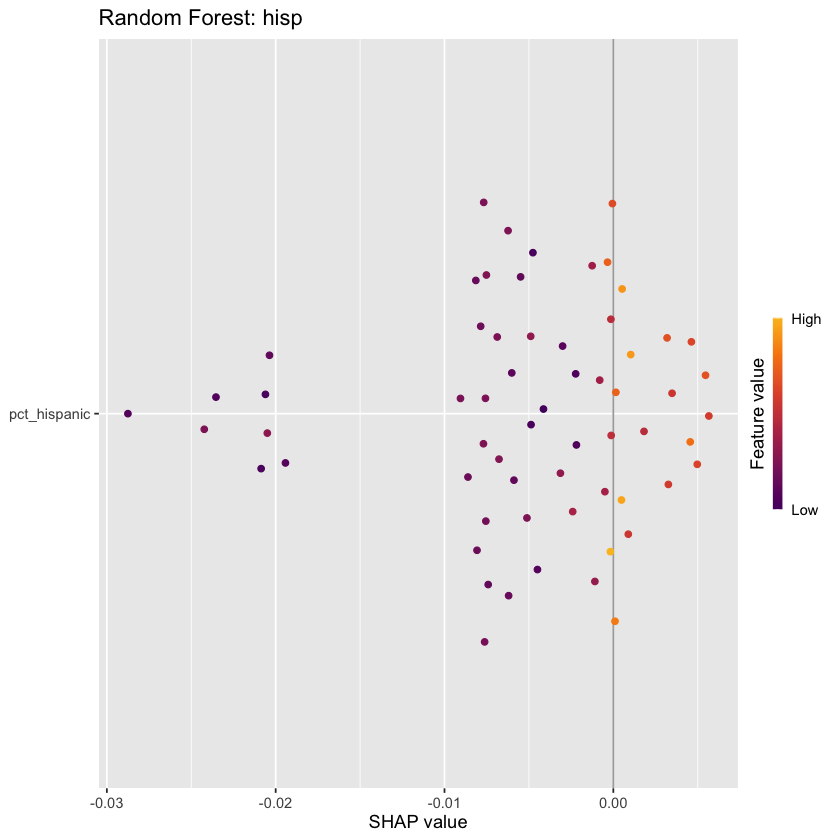

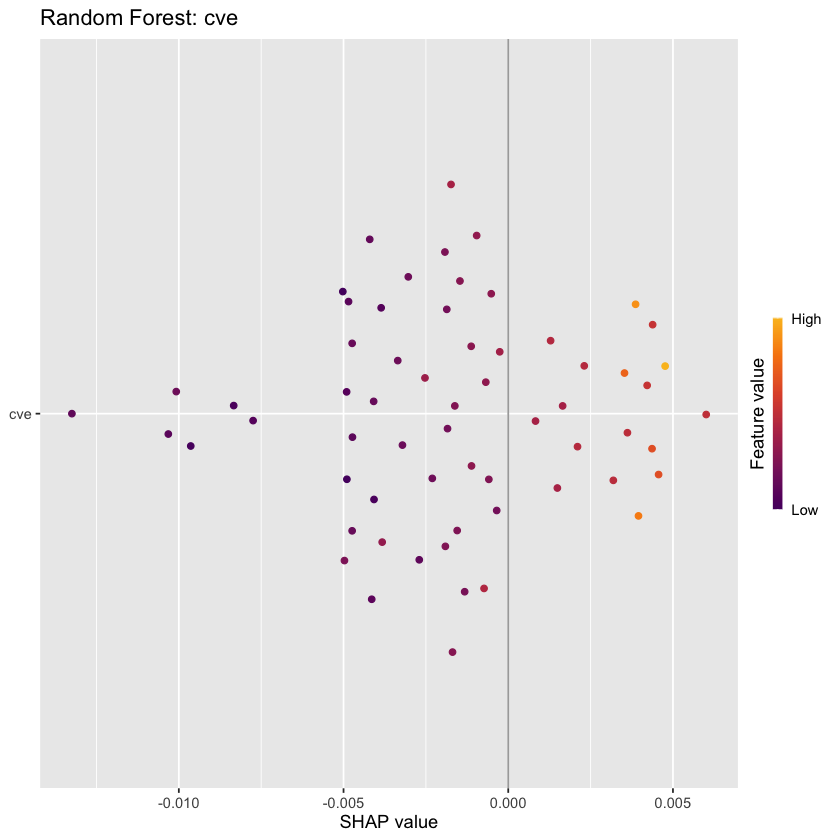

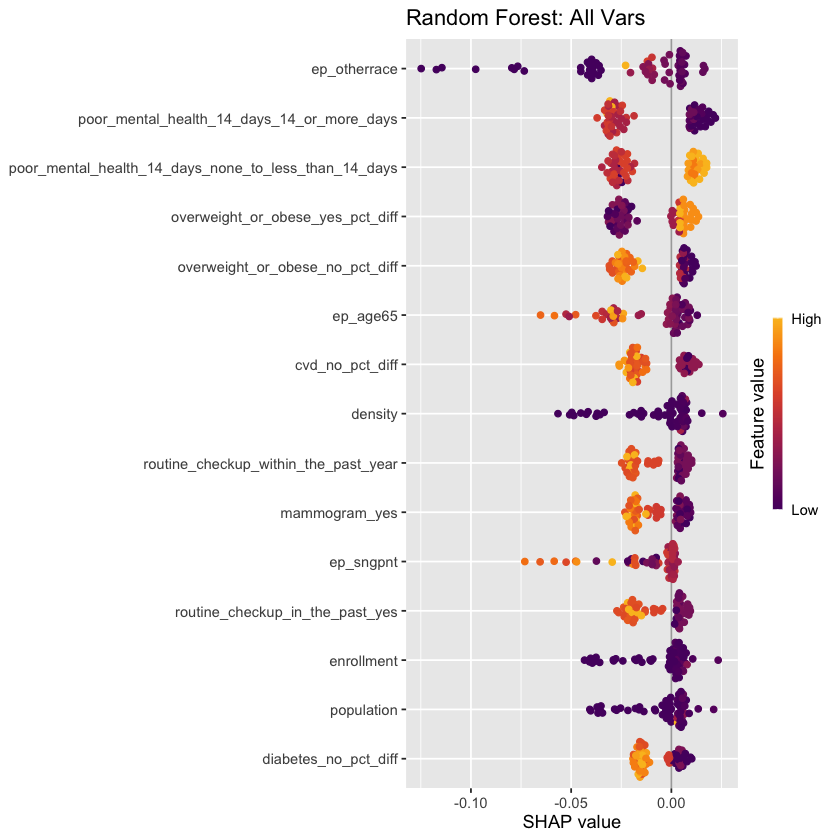

In [17]:
# beeswarm over a common-directionality subset of variables
vars <- c("enrollment", "overweight_or_obese_yes_pct_diff", "pct_black", "ep_munit",
          "ep_age65", "density", "any_cancer_yes", "population", "pct_uninsured", "ep_hburd")

X <- get_feature_values(shp_rf)
log_vars <- intersect(c("enrollment", "density", "population"), colnames(shp_rf))
for (v in log_vars) {
    X[[v]] <- log1p(X[[v]])   # log1p = log(1 + x); avoids -Inf if any value is 0
}

shp_rf_log <- shapviz(
    get_shap_values(shp_rf),
    X        = X,
    baseline = get_baseline(shp_rf)
)

sv_importance(shp_rf_log[, vars], kind = "beeswarm", max_display = 15) +
    ggtitle("Random Forest: Common Variable Directionality")

# single-feature beeswarms
sv_importance(shp_rf[, "pct_hispanic"], kind = "beeswarm", max_display = 15) +
    ggtitle("Random Forest: hisp")

sv_importance(shp_rf[, "cve"], kind = "beeswarm", max_display = 15) +
    ggtitle("Random Forest: cve")

# full beeswarm across every feature
sv_importance(shp_rf, kind = "beeswarm", max_display = 15) +
    ggtitle("Random Forest: All Vars")

### Feature interaction ranking

Same analysis as the XGBoost block: the mean absolute SHAP interaction matrix from treeshap (diagonal = main effects, off-diagonal = pairwise interaction strengths), with each pair judged against the larger of its two own main effects and flagged when the interaction is at least 10% of it.

In [18]:
m  <- sv_interaction(shp_rf_int, kind = "no")

# diagonal = each feature's own main effect; re-attach names that diag() strips
md <- setNames(diag(m), rownames(m))

# keep one copy of each unique off-diagonal pair (matrix is symmetric)
m2 <- m
m2[lower.tri(m2, diag = TRUE)] <- NA

pairs <- as.data.frame(as.table(m2))
pairs <- pairs[!is.na(pairs$Freq), ]
names(pairs) <- c("feature_a", "feature_b", "interaction")

# judge each pair against the larger of its two main effects
pairs$own_main <- pmax(md[as.character(pairs$feature_a)],
                       md[as.character(pairs$feature_b)])
pairs$vs_own   <- round(pairs$interaction / pairs$own_main, 3)
pairs$worth    <- ifelse(pairs$vs_own >= 0.1, "yes", "no")
pairs <- pairs[order(-pairs$interaction), ]

worth_pairs <- pairs[which(pairs$worth == "yes"), ]
#worth_pairs

### Confirming candidate interactions (random forest)

Same two checks as the XGBoost block: a dependence plot per flagged pair, then a correlation check.

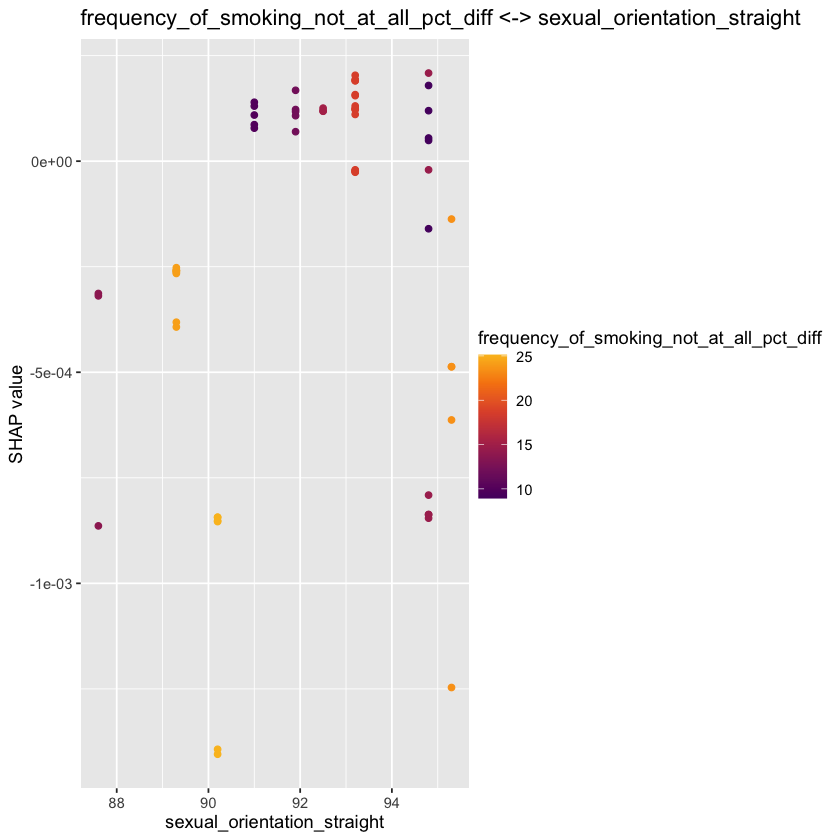

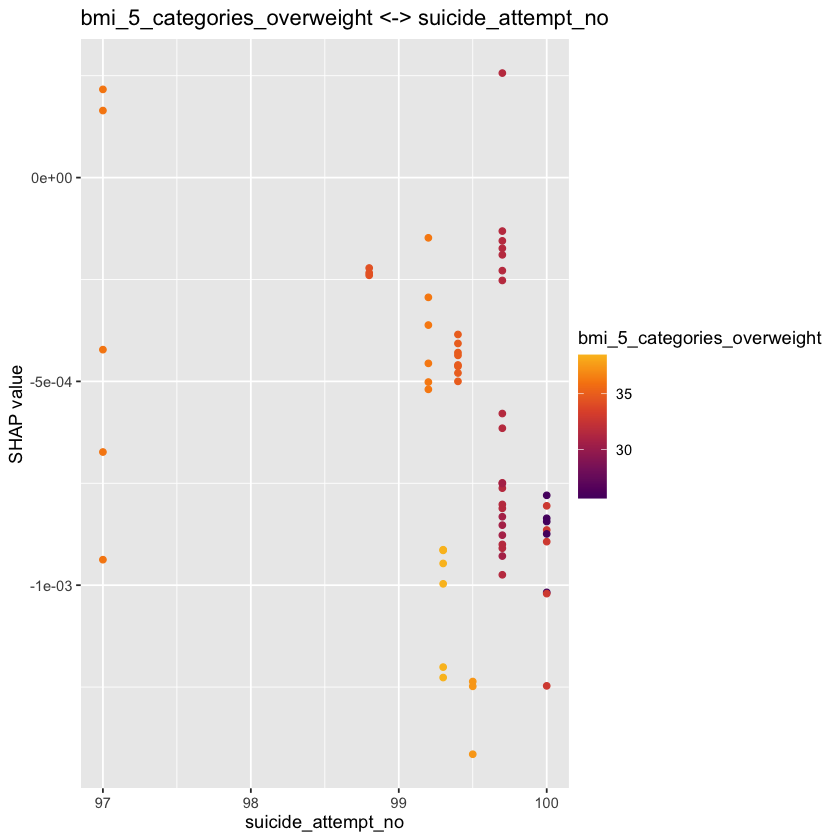

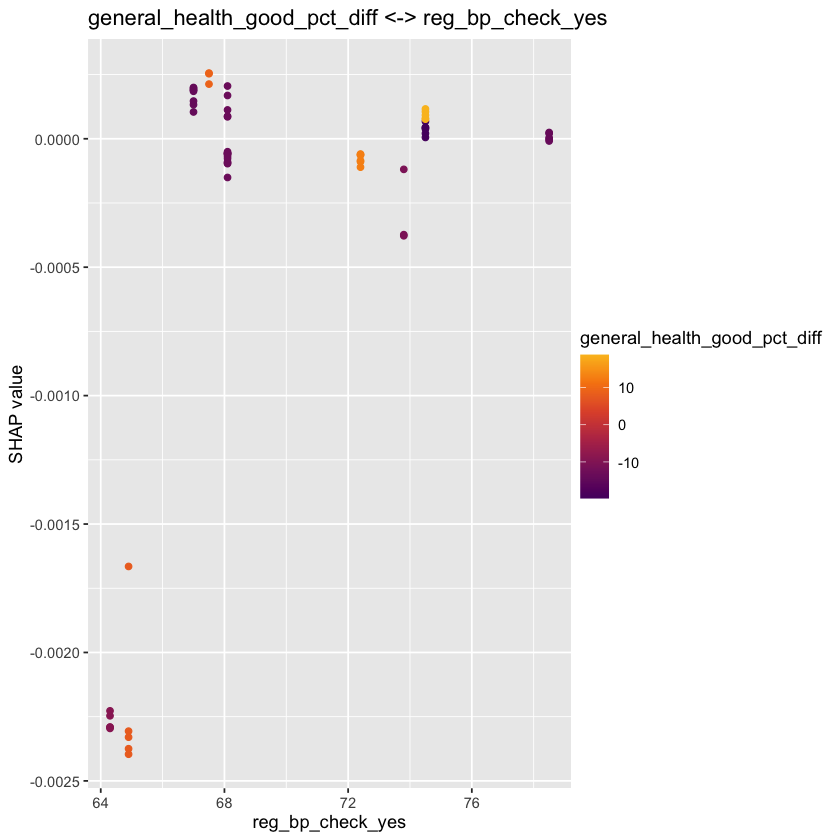

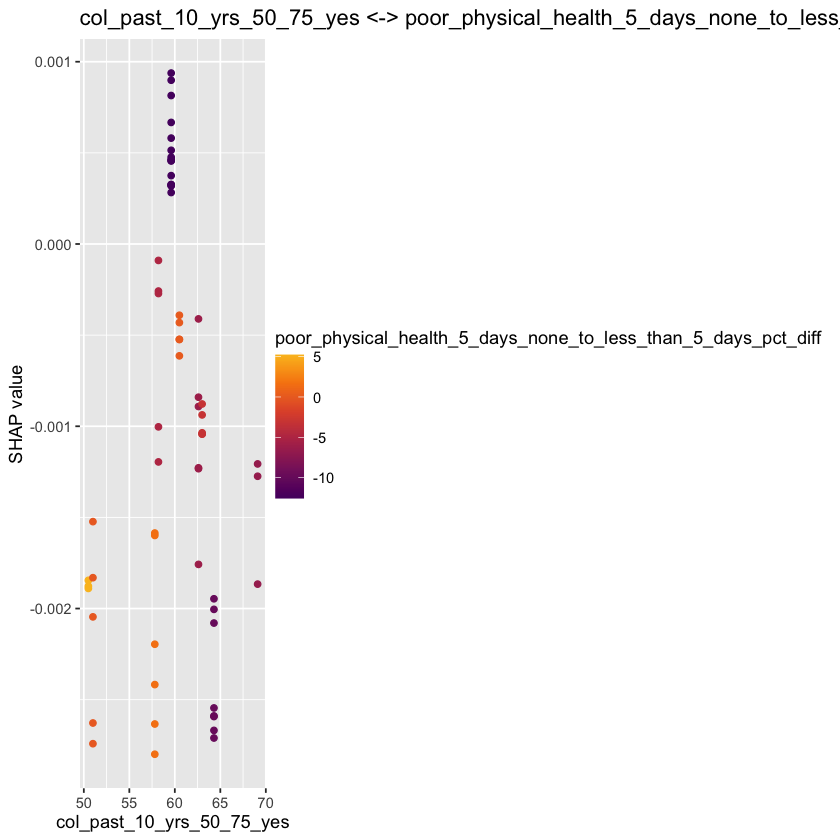

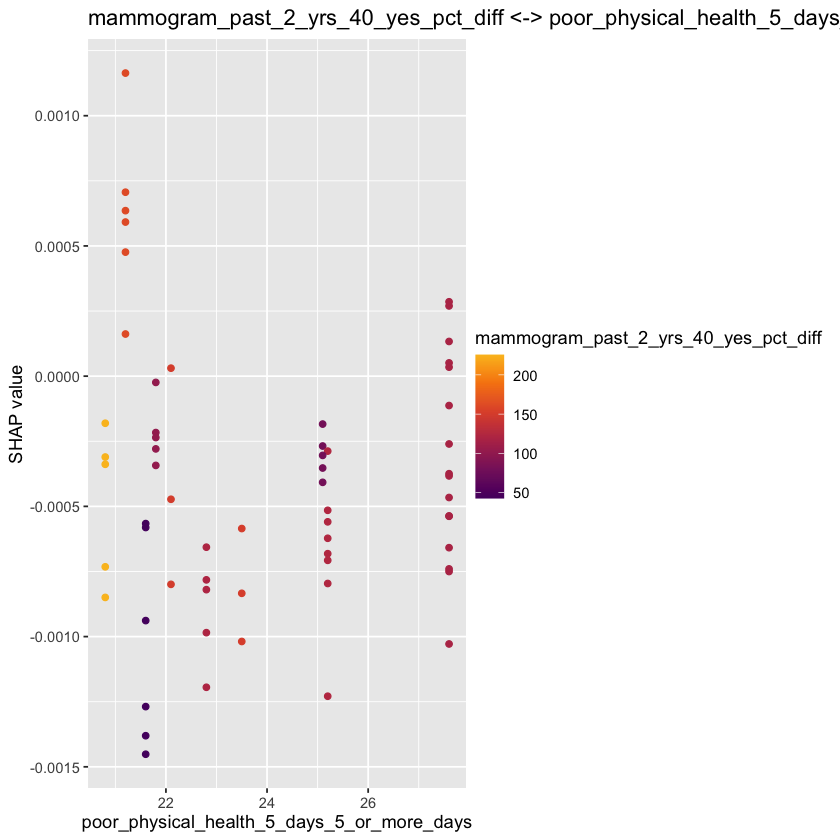

...

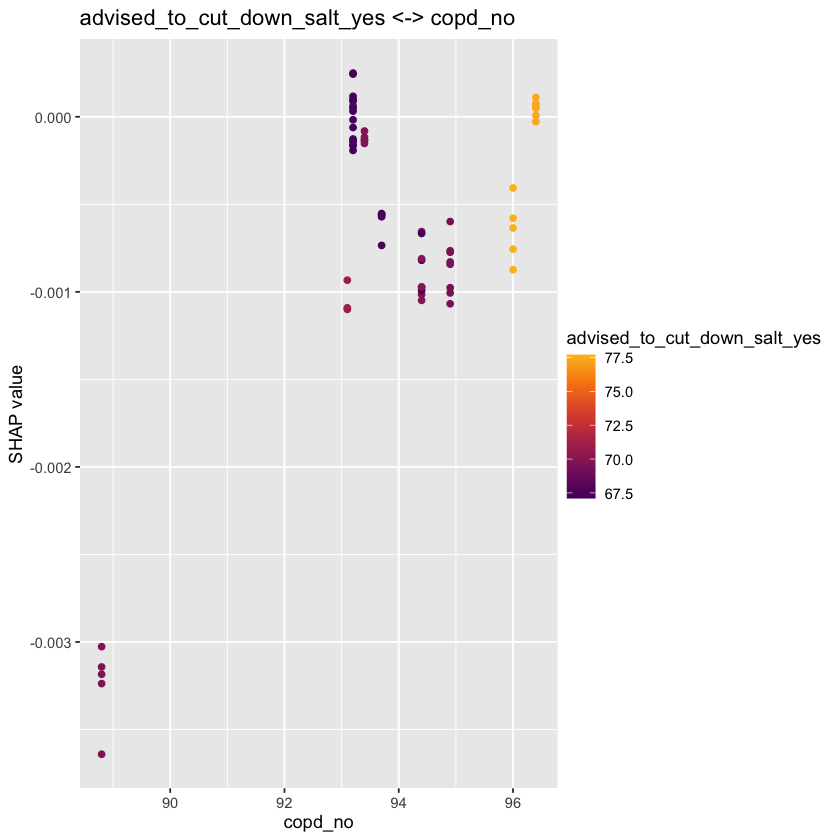

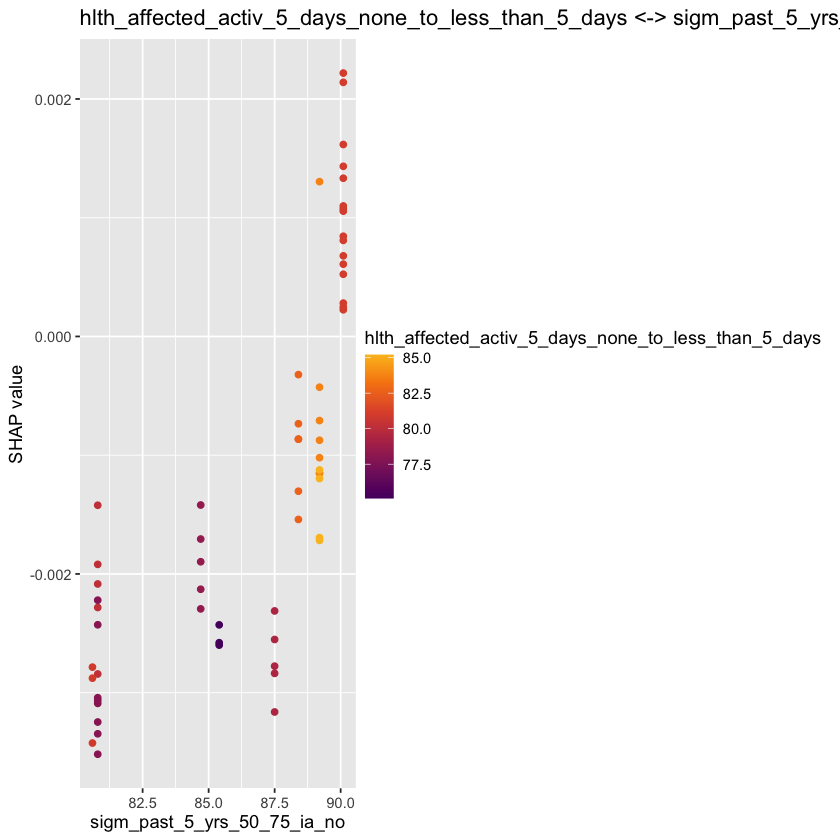

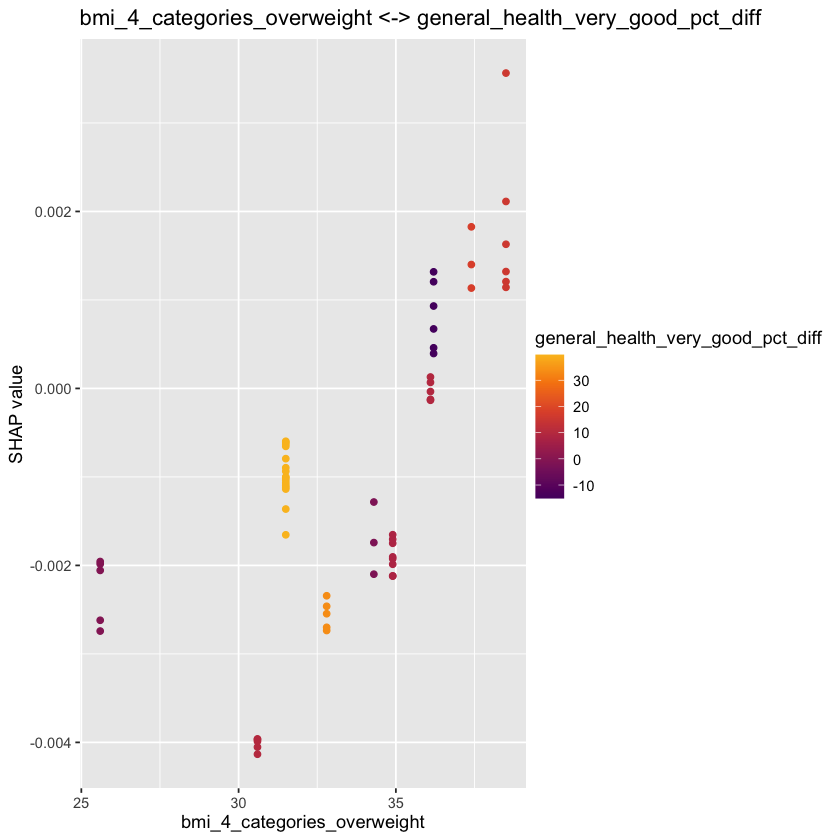

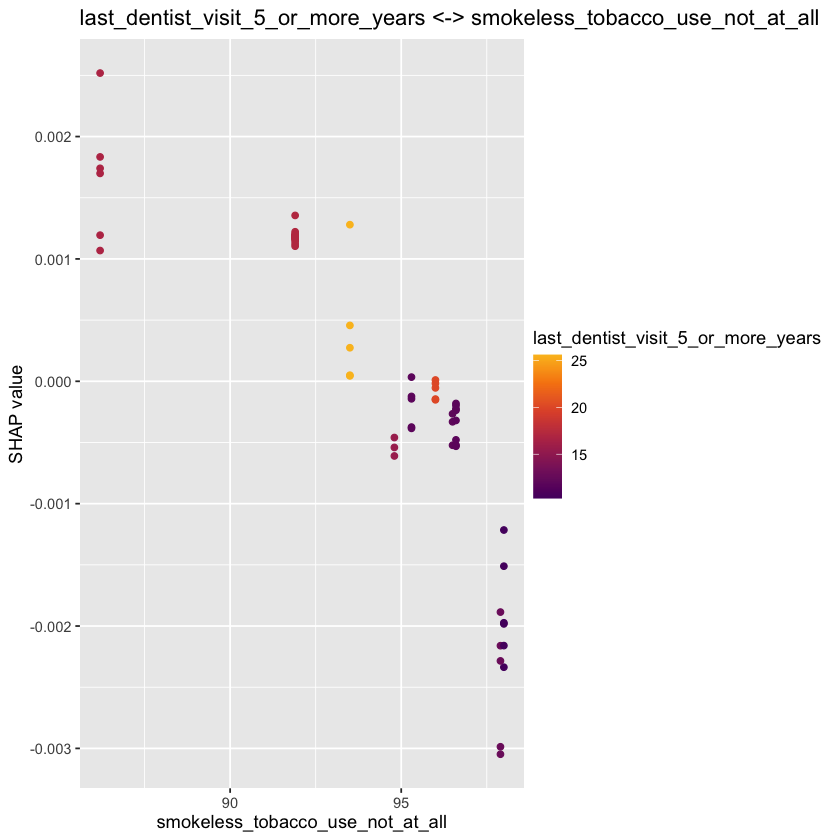

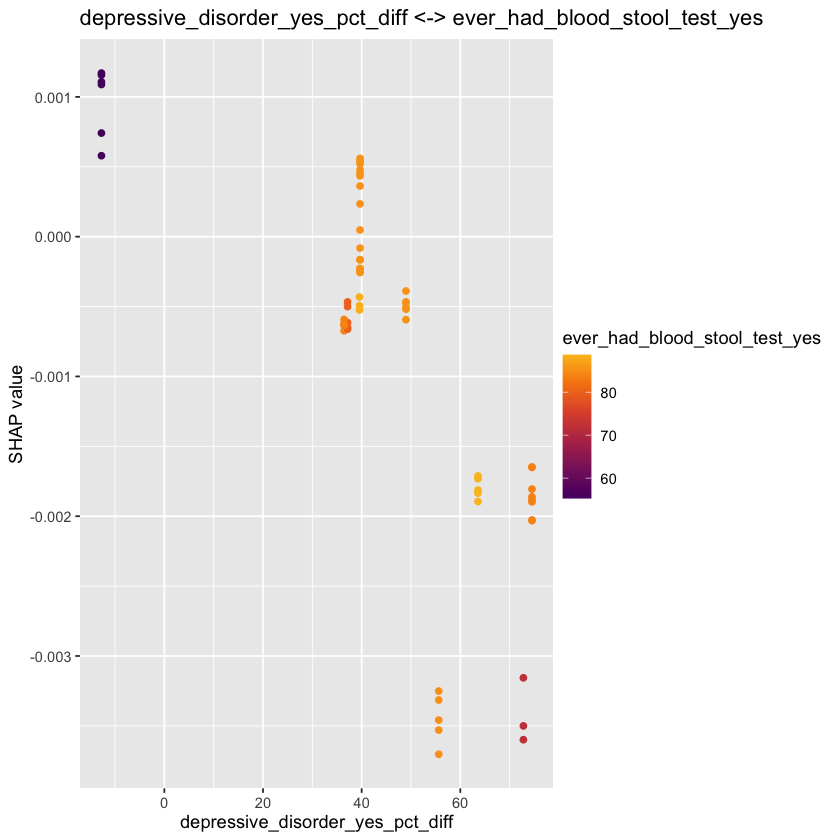

# A tibble: 216 × 3
   pair                                                          vs_own abs_corr
   <chr>                                                          <dbl>    <dbl>
 1 fobt_past_yr_ia_no <-> fobt_past_yr_no                         0.146    0.999
 2 general_health_excellent <-> mammogram_no_pct_diff             0.31     0.851
 3 ever_had_blood_stool_test_yes <-> poor_mental_health_5_days_…  0.124    0.824
 4 depressive_disorder_yes_pct_diff <-> poor_mental_health_5_da…  0.15     0.818
 5 flu_vaccine_location_store <-> smokeless_tobacco_use_not_at_…  0.108    0.813
 6 lifetime_asthma_yes <-> poor_physical_health_5_days_5_or_mor…  0.146    0.776
 7 ever_smoked_yes <-> flu_shot_in_past_year_yes                  0.121    0.775
 8 any_drinking_past_month_yes_pct_diff <-> poor_physical_healt…  0.139    0.764
 9 current_e_cig_user_yes <-> dr_rx_pain_talk_yes                 0.11     0.755
10 health_care_coverage_no_pct_diff <-> pre_diabetes_yes_pct_di…  0.23     0.748
# ℹ 206 

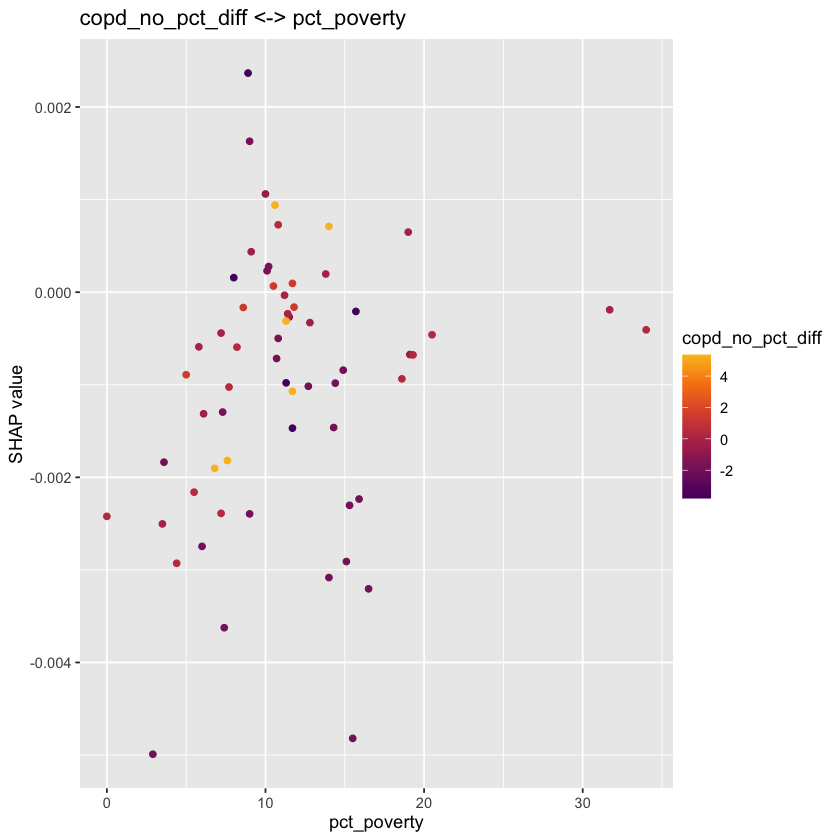

In [20]:
# Shortlist = worth=="yes", de-duplicated, ranked by vs_own
candidates <- worth_pairs %>%
  filter(worth == "yes") %>%
  mutate(a = as.character(feature_a), b = as.character(feature_b),
         pair = paste(pmin(a, b), pmax(a, b), sep = " <-> ")) %>%
  distinct(pair, .keep_all = TRUE) %>%
  arrange(desc(vs_own))

## STEP 1 — dependence plot per candidate pair
for (i in seq_len(nrow(candidates))) {
  print(
    sv_dependence(shp_rf_int, v = candidates$a[i], color_var = candidates$b[i]) +
      ggtitle(candidates$pair[i])
  )
}

## STEP 2 — flag correlation-induced "interactions"
# X_expl = the test-set predictor data frame built in the treeshap setup cell
feats <- unique(c(candidates$a, candidates$b))
corr  <- cor(X_expl[, feats], use = "pairwise.complete.obs")
candidates <- candidates %>%
  rowwise() %>% mutate(abs_corr = abs(corr[a, b])) %>% ungroup()

print(candidates %>%
        select(pair, vs_own, abs_corr) %>%
        arrange(desc(abs_corr)))   # high abs_corr rows are the suspects

In [ ]:
pairs_looked_at <- list(
  c("bmi_5_categories_obese",        "health_care_coverage_age_18_yes_pct_diff"),
  c("flu_shot_18_64_yes_pct_diff",   "col_past_10_yrs_50_75_yes_pct_diff"),    
  c("advised_to_cut_down_salt_yes",  "difficulty_concentrating_yes"),           
  c("sigm_past_10_yrs_age_50_75_no", "flu_shot_18_64_yes_pct_diff"),              
  c("v_col_5_yrs_50_75_ia_no",       "ever_smoked_yes_pct_diff"),             
  c("col_past_10_yrs_50_75_yes",     "poor_physical_health_5_days_none_to_less_than_5_days_pct_diff"),
  c("reg_bp_check_yes",              "general_health_good_pct_diff"),            
  c("teeth_removed_yes",             "current_smoker_no_pct_diff"),              
  c("binge_drinking_yes_pct_diff",   "all_teeth_removed_65_no"),                  
  c("sigm_past_10_yrs_50_75_ia_no",  "bmi_5_categories_obese"),                    
  c("teeth_removed_yes",             "cervical_cancer_screening_hp_yes"),       
  c("copd_no",                       "health_care_coverage_age_18_yes_pct_diff"), 
  c("health_care_coverage_age_18_no_pct_diff", "heart_disease_no"),             
  c("ever_had_blood_stool_test_yes", "general_health_fair_pct_diff")              
)

for (p in pairs_looked_at) {
  print(
    sv_dependence(shp_rf_int, v = p[1], color_var = p[2]) +
      ggtitle(paste(p[1], "<->", p[2])))
}